In [ ]:
import os
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import KFold, cross_val_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_log_error
# Ignore warnings for cleaner output
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


DATA VISUALIZATION

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
1         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      5   
2         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      9   
3         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
4         Lvl    AllPub  ...        0    NaN   NaN         NaN       0     12   

  YrSold  SaleType  SaleCondition  SalePrice  
0   2008        WD   

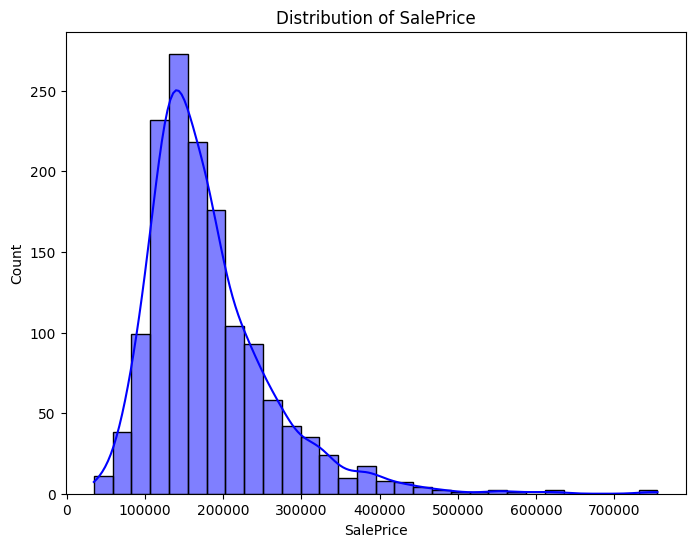

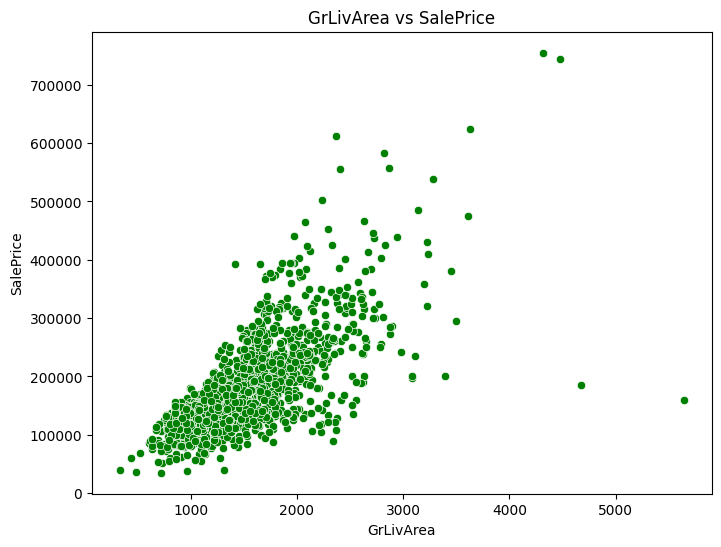

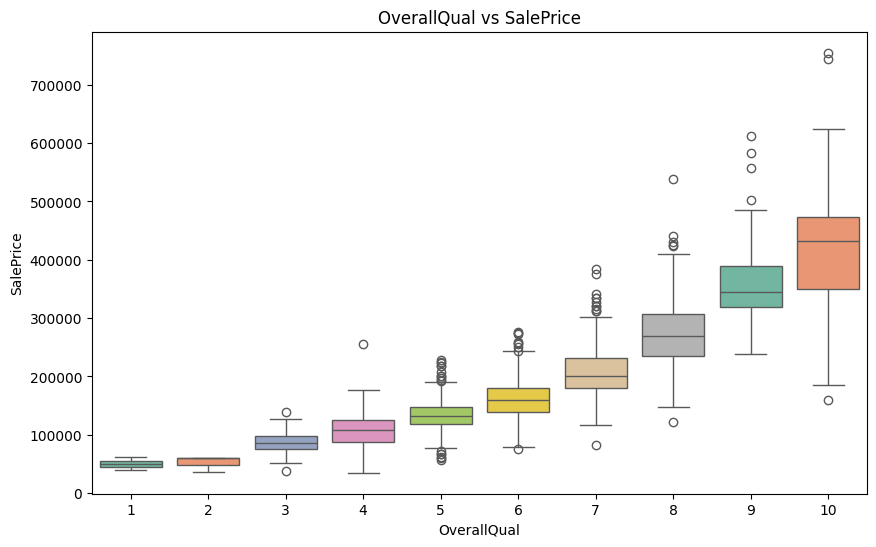

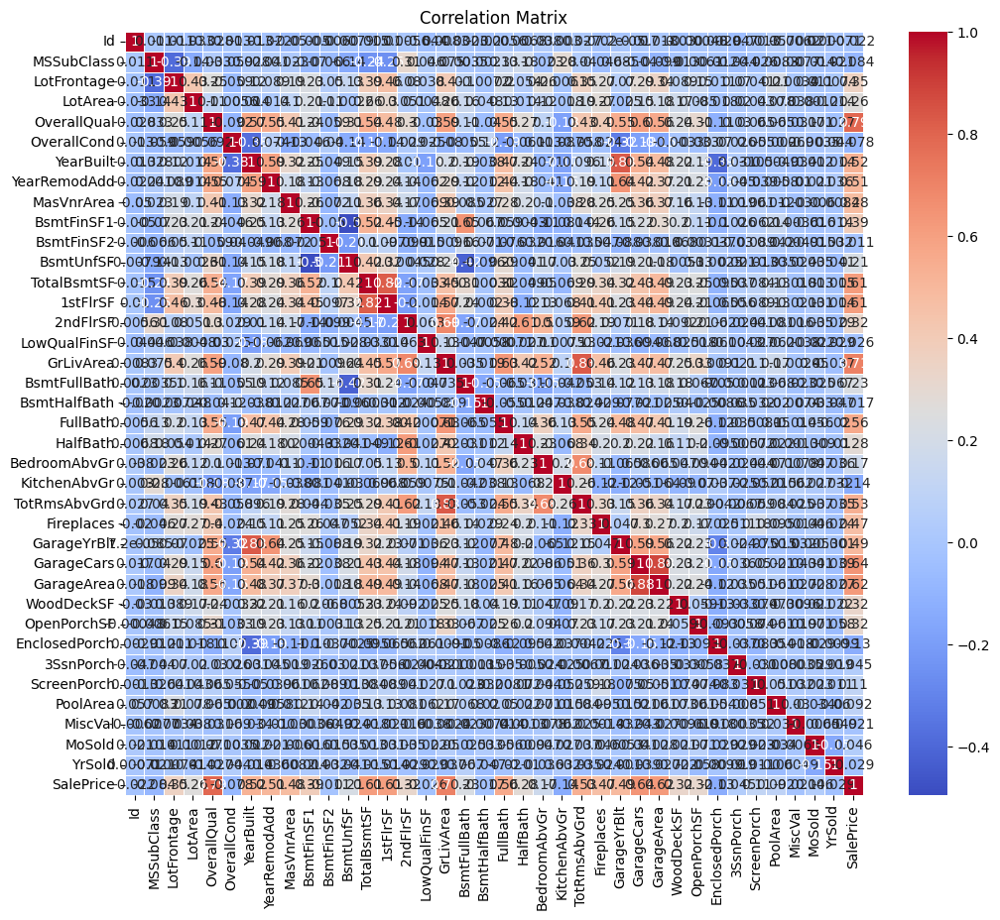

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
train_data = pd.read_csv('/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/train (1).csv')
# Basic data exploration
print(train_data.head())
print(train_data.info())
print(train_data.describe())

# Example of visualization
# Histogram of SalePrice
plt.figure(figsize=(8, 6))
sns.histplot(train_data['SalePrice'], bins=30, kde=True, color='blue')
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Count')
plt.show()

# Scatter plot of GrLivArea vs SalePrice
plt.figure(figsize=(8, 6))
sns.scatterplot(x='GrLivArea', y='SalePrice', data=train_data, color='green')
plt.title('GrLivArea vs SalePrice')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')
plt.show()

# Box plot of OverallQual vs SalePrice
plt.figure(figsize=(10, 6))
sns.boxplot(x='OverallQual', y='SalePrice', data=train_data, palette='Set2')
plt.title('OverallQual vs SalePrice')
plt.xlabel('OverallQual')
plt.ylabel('SalePrice')
plt.show()

# Select only numeric columns for correlation
numeric_data = train_data.select_dtypes(include=[np.number])

# Correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

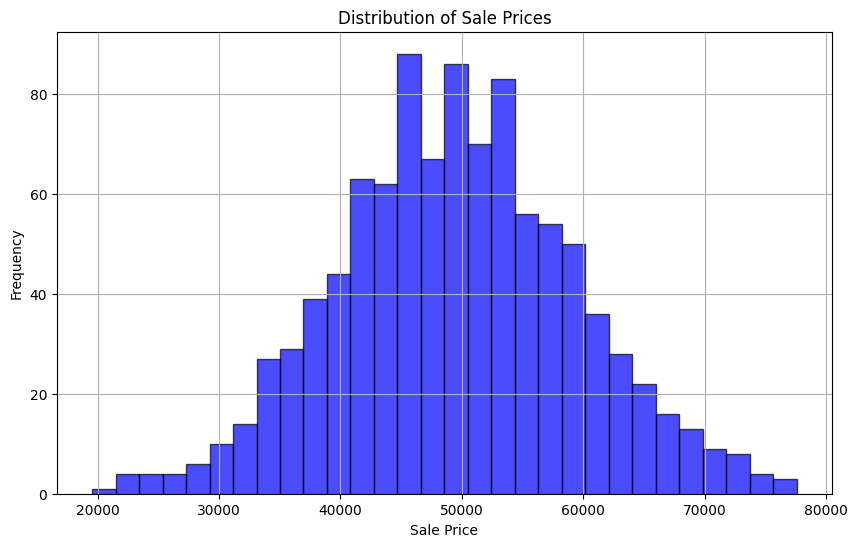

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming df_train is your pandas DataFrame containing the data
# Generating some example data for demonstration
np.random.seed(0)
df_train = pd.DataFrame({'SalePrice': np.random.normal(50000, 10000, 1000)})

# Plotting the histogram with matplotlib
plt.figure(figsize=(10, 6))
plt.hist(df_train['SalePrice'], bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Sale Prices')
plt.xlabel('Sale Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [ ]:
def load_data(train_path, test_path): # Add parameters to accept file paths
    # Define paths and load datasets
    data_dir = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques")
    train_df = pd.read_csv(data_dir / train_path.name, index_col="Id") # Use provided train_path
    test_df = pd.read_csv(data_dir / test_path.name, index_col="Id") # Use provided test_path

    # Combine datasets for uniform preprocessing
    combined_df = pd.concat([train_df, test_df], keys=['train', 'test'])
    combined_df = clean_data(combined_df)
    combined_df = encode_data(combined_df)
    combined_df = impute_data(combined_df)

    # Split the combined dataframe back into train and test sets
    train_df = combined_df.xs('train')
    test_df = combined_df.xs('test')

    return train_df, test_df
def clean_data(df):
    # Indent the code block within the function
    df['Exterior2nd'].replace({'Brk Cmn': 'BrkComm'}, inplace=True)
    df['GarageYrBlt'] = df['GarageYrBlt'].where(df['GarageYrBlt'] <= 2010, df['YearBuilt'])
    df.rename(columns={
        '1stFlrSF': 'FirstFlrSF',
        '2ndFlrSF': 'SecondFlrSF',
        '3SsnPorch': 'ThreeSeasonPorch'
    }, inplace=True)
    return df
    # Apply the renaming to X_test as well
    X_test.rename(columns={
    '1stFlrSF': 'FirstFlrSF',
    '2ndFlrSF': 'SecondFlrSF',
    '3SsnPorch': 'ThreeSeasonPorch'
}, inplace=True)

# You can specify the paths to your data files here
train_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/train (1).csv")
test_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/test.csv")

train_df, test_df = load_data(train_path, test_path) # Call with file paths

In [ ]:
def clean_data(df):
    df['Exterior2nd'].replace({'Brk Cmn': 'BrkComm'}, inplace=True)
    df['GarageYrBlt'] = df['GarageYrBlt'].where(df['GarageYrBlt'] <= 2010, df['YearBuilt'])
    df.rename(columns={
        '1stFlrSF': 'FirstFlrSF',
        '2ndFlrSF': 'SecondFlrSF',
        '3SsnPorch': 'ThreeSeasonPorch'
    }, inplace=True)
    return df

In [ ]:
def encode_data(df):
    nominal_features = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2',
                        'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
                        'Foundation', 'Heating', 'GarageType', 'MiscFeature', 'SaleType', 'SaleCondition']
    for feature in nominal_features:
        df[feature] = df[feature].astype('category')

    ordinal_features = {
        'OverallQual': list(range(1, 11)),
        'OverallCond': list(range(1, 11)),
        'ExterQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'ExterCond': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'BsmtQual': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'BsmtCond': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'HeatingQC': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'KitchenQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'FireplaceQu': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'GarageQual': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'GarageCond': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
        'PoolQC': ['None', 'Fa', 'TA', 'Gd', 'Ex']
    }
    for feature, categories in ordinal_features.items():
        df[feature] = df[feature].astype(pd.api.types.CategoricalDtype(categories, ordered=True))

    return df

def impute_data(df):
    for column in df.select_dtypes(include=['number']).columns:
        df[column].fillna(0, inplace=True)
    for column in df.select_dtypes(include=['category']).columns:
        # Fill missing values with a valid category, or add 'None' to the categories
        if 'None' in df[column].cat.categories:
            df[column].fillna('None', inplace=True)  # Use 'None' if it's a valid category
        else:
            df[column] = df[column].cat.add_categories(['None']).fillna('None')  # Add 'None' to categories if needed
    return df

# You can specify the paths to your data files here
train_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/train (1).csv")
test_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/test.csv")
train_df, test_df = load_data(train_path, test_path)

In [ ]:
display(train_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   MSSubClass        1460 non-null   category
 1   MSZoning          1460 non-null   category
 2   LotFrontage       1460 non-null   float64 
 3   LotArea           1460 non-null   int64   
 4   Street            1460 non-null   category
 5   Alley             1460 non-null   category
 6   LotShape          1460 non-null   object  
 7   LandContour       1460 non-null   object  
 8   Utilities         1460 non-null   object  
 9   LotConfig         1460 non-null   category
 10  LandSlope         1460 non-null   object  
 11  Neighborhood      1460 non-null   category
 12  Condition1        1460 non-null   category
 13  Condition2        1460 non-null   category
 14  BldgType          1460 non-null   category
 15  HouseStyle        1460 non-null   category
 16  OverallQual       1460 non-nu

None

In [ ]:
display(test_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1459 entries, 1461 to 2919
Data columns (total 88 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   MSSubClass        1459 non-null   category
 1   MSZoning          1459 non-null   category
 2   LotFrontage       1459 non-null   float64 
 3   LotArea           1459 non-null   int64   
 4   Street            1459 non-null   category
 5   Alley             1459 non-null   category
 6   LotShape          1459 non-null   object  
 7   LandContour       1459 non-null   object  
 8   Utilities         1457 non-null   object  
 9   LotConfig         1459 non-null   category
 10  LandSlope         1459 non-null   object  
 11  Neighborhood      1459 non-null   category
 12  Condition1        1459 non-null   category
 13  Condition2        1459 non-null   category
 14  BldgType          1459 non-null   category
 15  HouseStyle        1459 non-null   category
 16  OverallQual       1459 non

None

In [ ]:
# Assuming your DataFrame is named df
summary = train_df.describe()
print(summary)

       LotFrontage        LotArea    YearBuilt  YearRemodAdd   MasVnrArea  \
count  1460.000000    1460.000000  1460.000000   1460.000000  1460.000000   
mean     57.623288   10516.828082  1971.267808   1984.865753   103.117123   
std      34.664304    9981.264932    30.202904     20.645407   180.731373   
min       0.000000    1300.000000  1872.000000   1950.000000     0.000000   
25%      42.000000    7553.500000  1954.000000   1967.000000     0.000000   
50%      63.000000    9478.500000  1973.000000   1994.000000     0.000000   
75%      79.000000   11601.500000  2000.000000   2004.000000   164.250000   
max     313.000000  215245.000000  2010.000000   2010.000000  1600.000000   

        BsmtFinSF1   BsmtFinSF2    BsmtUnfSF  TotalBsmtSF   FirstFlrSF  ...  \
count  1460.000000  1460.000000  1460.000000  1460.000000  1460.000000  ...   
mean    443.639726    46.549315   567.240411  1057.429452  1162.626712  ...   
std     456.098091   161.319273   441.866955   438.705324   386.58773

In [ ]:
summary=test_df.describe()
print(summary)

       LotFrontage       LotArea  OverallQual  OverallCond    YearBuilt  \
count  1459.000000   1459.000000  1459.000000  1459.000000  1459.000000   
mean     57.910212   9819.161069     5.078821     4.553804  1971.357779   
std      32.266054   4955.517327     1.436812     1.113740    30.390071   
min       0.000000   1470.000000     0.000000     0.000000  1879.000000   
25%      44.000000   7391.000000     4.000000     4.000000  1953.000000   
50%      63.000000   9399.000000     5.000000     4.000000  1973.000000   
75%      78.000000  11517.500000     6.000000     5.000000  2001.000000   
max     200.000000  56600.000000     9.000000     8.000000  2010.000000   

       YearRemodAdd   MasVnrArea   BsmtFinSF1   BsmtFinSF2    BsmtUnfSF  ...  \
count   1459.000000  1459.000000  1459.000000  1459.000000  1459.000000  ...   
mean    1983.662783    99.673749   438.902673    52.583276   553.915010  ...   
std       21.130467   177.001792   455.257119   176.698671   437.351324  ...   
min 

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer # Import SimpleImputer to handle NaNs

def score_dataset(X, y, model=RandomForestRegressor()):
    # One-hot encode categorical features
    categorical_cols = X.select_dtypes(include=['object', 'category']).columns
    X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

    # Impute missing values using SimpleImputer - strategy can be mean, median, most_frequent etc.
    imputer = SimpleImputer(strategy='mean') # Replace NaNs with the mean of the column
    X_encoded = imputer.fit_transform(X_encoded)

    # Perform cross-validation
    scores = cross_val_score(model, X_encoded, y, cv=5, scoring='neg_mean_squared_log_error')
    rmsle_score = np.sqrt(-scores.mean())

    return rmsle_score

# Assuming X_train is your training data and y_train is your target variable
# Prepare data for scoring
X_train = train_df.drop(columns='SalePrice')
y_train = train_df['SalePrice']

baseline_score = score_dataset(X_train, y_train)
print(f"Baseline RMSLE: {baseline_score:.5f}")

Baseline RMSLE: 0.15380


In [ ]:
def add_new_features(df):
    # Mathematical transforms
    df['LivLotRatio'] = df['GrLivArea'] / df['LotArea']
    # Use the corrected column name 'FirstFlrSF'
    df['Spaciousness'] = (df['FirstFlrSF'] + df['SecondFlrSF']) / df['TotRmsAbvGrd']

    # Interaction features
    # Convert categorical features to numerical before multiplication
    # Handle potential non-numeric values in 'OverallQual' and 'OverallCond'
    # If 'OverallQual' is categorical, fill missing values with a valid category or a placeholder string
    if df['OverallQual'].dtype.name == 'category':
        # Get a valid category to fill missing values, or use -1 as a placeholder
        fill_value = df['OverallQual'].cat.categories[0] if df['OverallQual'].cat.categories.size > 0 else -1
        df['OverallQual'] = df['OverallQual'].fillna(fill_value).cat.codes  # Fill with a valid category and convert to codes
    else:
        df['OverallQual'] = df['OverallQual'].fillna(0).astype(int)  # If already numerical, fill with 0 and convert to int

    # Handle 'OverallCond' similarly if it's categorical
    if df['OverallCond'].dtype.name == 'category':
        # Get a valid category to fill missing values, or use -1 as a placeholder
        fill_value = df['OverallCond'].cat.categories[0] if df['OverallCond'].cat.categories.size > 0 else -1
        df['OverallCond'] = df['OverallCond'].fillna(fill_value).cat.codes  # Fill with a valid category and convert to codes
    else:
        df['OverallCond'] = df['OverallCond'].fillna(0).astype(int)  # If already numerical, fill with 0 and convert to int

    df['OverallGrade'] = df['OverallQual'] * df['OverallCond']

    # Counts
    porch_cols = ['WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ThreeSeasonPorch', 'ScreenPorch']  # Corrected to 'ThreeSeasonPorch'
    df['TotalPorchSF'] = df[porch_cols].sum(axis=1)

    return df

In [ ]:
# You can specify the paths to your data files here
train_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/train (1).csv")
test_path = Path("/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/test.csv")
train_df, test_df = load_data(train_path, test_path) # Assuming load_data is defined elsewhere

# Prepare data for scoring
X_train = train_df.drop(columns='SalePrice')
y_train = train_df['SalePrice']
X_test = test_df # Create X_test from the loaded test data


X_train = add_new_features(X_train)
X_test = add_new_features(X_test) # Now X_test is defined



In [ ]:
def apply_clustering(df, features, n_clusters=10):
    # Mathematical transforms
    df['LivLotRatio'] = df['GrLivArea'] / df['LotArea']
    # Use the corrected column name 'FirstFlrSF'
    df['Spaciousness'] = (df['FirstFlrSF'] + df['SecondFlrSF']) / df['TotRmsAbvGrd']

    # Interaction features
    df['OverallGrade'] = df['OverallQual'] * df['OverallCond']

    # Counts
    porch_cols = ['WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ThreeSeasonPorch', 'ScreenPorch']  # Corrected column name
    df['TotalPorchSF'] = df[porch_cols].sum(axis=1)
    scaler = StandardScaler() # Correct indentation here
    scaled_features = scaler.fit_transform(df[features])

    # Impute NaNs before clustering
    imputer = SimpleImputer(strategy='mean')
    scaled_features = imputer.fit_transform(scaled_features)

    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    df['Cluster'] = kmeans.fit_predict(scaled_features)

    return df

# Import necessary libraries
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans # Remember to import KMeans

def apply_pca(df, features, n_components=3):
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(df[features])

    # Handle NaNs before applying PCA
    imputer = SimpleImputer(strategy='mean')  # Replace NaNs with the mean of the column
    scaled_features = imputer.fit_transform(scaled_features)

    pca = PCA(n_components=n_components, random_state=0)
    pca_features = pca.fit_transform(scaled_features)

    for i in range(n_components):
        df[f'PCA_{i+1}'] = pca_features[:, i]

    return df

# Call apply_clustering and apply_pca after defining them
X_train = add_new_features(X_train)
X_test = add_new_features(X_test)

cluster_features = ['GrLivArea', 'TotalBsmtSF', 'FirstFlrSF', 'SecondFlrSF', 'LotArea', 'ThreeSeasonPorch']  # Adjusted to 'ThreeSeasonPorch'
X_train = apply_clustering(X_train, cluster_features)
X_test = apply_clustering(X_test, cluster_features)

pca_features = ['GrLivArea', 'GarageArea', 'TotalBsmtSF', 'YearRemodAdd']
X_train = apply_pca(X_train, pca_features)
X_test = apply_pca(X_test, pca_features)

In [ ]:
final_score = score_dataset(X_train, y_train)
print(f"Final RMSLE after feature engineering: {final_score:.5f}")


Final RMSLE after feature engineering: 0.14572


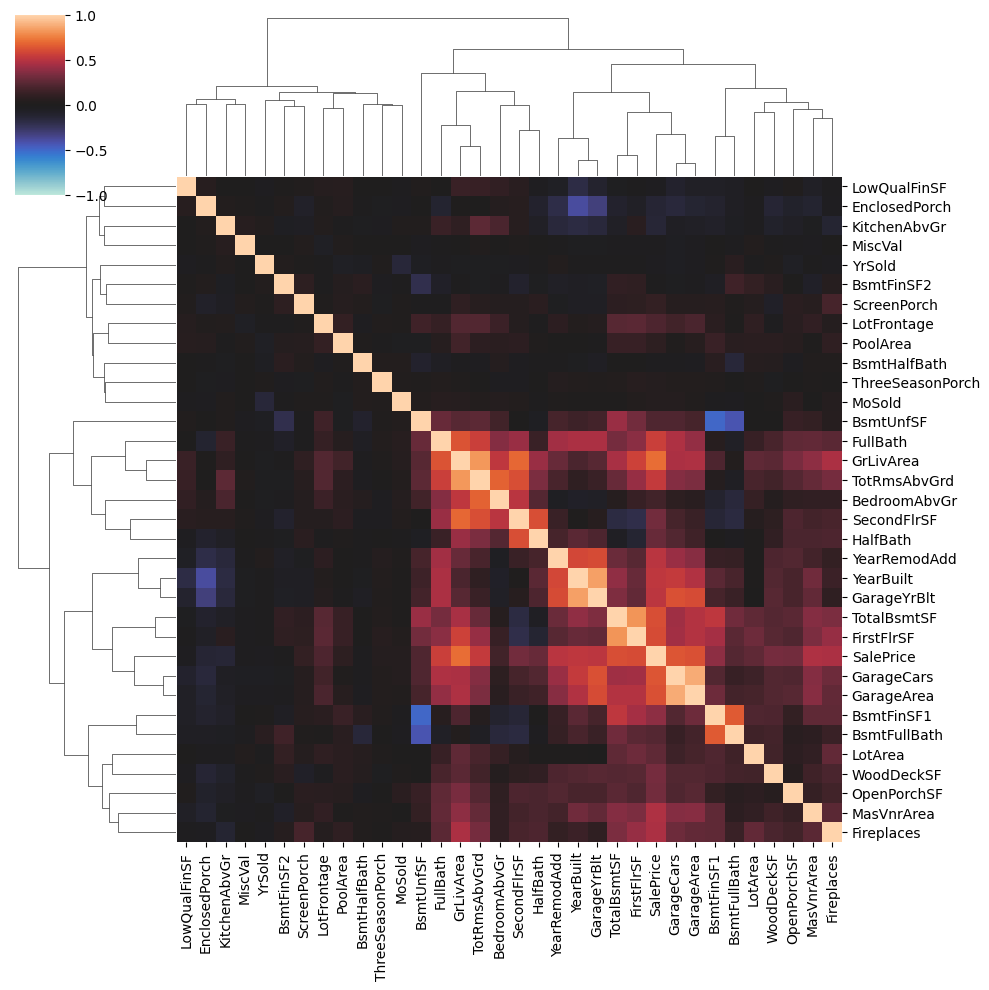

In [ ]:
import seaborn as sns
def corrplot(df, method="pearson", annot=True, **kwargs):

    sns.clustermap(
        df.corr(method, numeric_only=True),
        vmin=-1.0,
        vmax=1.0,
        cmap="icefire",
        method="complete",
        annot=annot,
        **kwargs,
    )


corrplot(train_df, annot=None)

In [ ]:
# Assuming 'train_df' from your previous code contains the data
data = train_df.copy()  # Create a copy to avoid modifying the original

# Replace 'SalePrice' with the actual name of your target column
X = data.drop('SalePrice', axis=1)
y = data['SalePrice']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming data is already loaded and split into X_train, X_test, y_train, y_test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4)

In [ ]:

import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X_train, X_test, y_train, and y_test are already defined

# Define columns for numeric and non-numeric transformations
numeric_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(exclude=['number']).columns

# Create transformers
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])
categorical_transformer = OneHotEncoder(handle_unknown='ignore', sparse=False)

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

# Define the parameter distribution for RandomizedSearchCV
param_distributions = {
    'regressor__alpha': np.logspace(-4, 4, 50)
}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(pipeline, param_distributions, n_iter=20, cv=5, scoring='r2', n_jobs=-1, random_state=42)
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLiv...
       3.72759372e+00, 5.42867544e+00, 7.90604321e+00, 1.15139540e+01,
       1.67683294e+01, 2.44205309e+01, 3.55648031e+01, 5.17947468e+01,
       7.54312006e+01, 1.09854114e+02, 1.59985872e+02, 2.32995181e+02,
       3.39322177e+02, 4.94171336e+02, 7.19685673e+02, 1.04811313e+03,
       1.52641797e+03, 2.22299648e+03, 3.23745754e+03, 4.71486636e+03,
       6.86648845e+03, 1.00000000e+04])},
                   random_state=42, scoring='r2')

In [ ]:
# Best model after hyperparameter tuning
ridge = random_search.best_estimator_

# Predicting Training data with the best pipeline
y_train_pred = ridge.predict(X_train)

# Model Evaluation on Training Data
r2_train = r2_score(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Calculate adjusted R-squared for training data
n_train = len(y_train)
p_train = X_train.shape[1]  # Adjusted R^2 should consider all features in X_train
adj_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Print the evaluation metrics for training data
print('Training Data Evaluation:')
print('R^2:', r2_train)
print('Adjusted R^2:', adj_r2_train)
print('MAE:', mae_train)
print('MSE:', mse_train)
print('RMSE:', rmse_train)

Training Data Evaluation:
R^2: 0.8035898300429942
Adjusted R^2: 0.787118064197343
MAE: 19992.084090948993
MSE: 1319047777.3730998
RMSE: 36318.69735237072


Text(0.5, 1.0, 'Train Data: Actual vs Predicted')

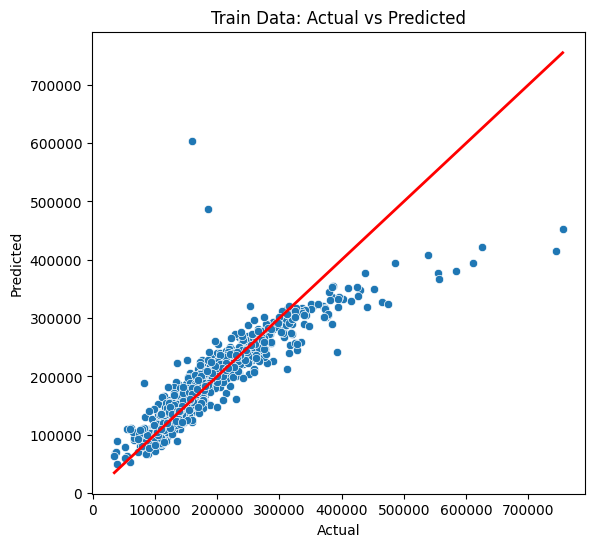

In [ ]:
# Visualization
# Plotting the residuals for train and test data
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='red', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Train Data: Actual vs Predicted')


Text(0.5, 1.0, 'Train Data Residuals')

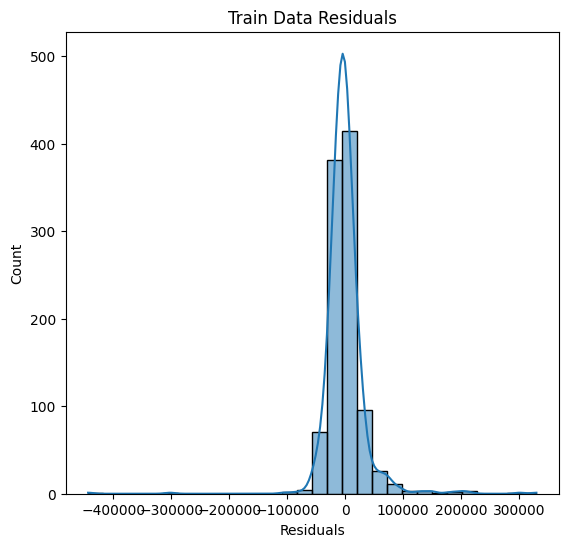

In [ ]:
# Plotting residuals
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(y_train - y_train_pred, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Train Data Residuals')

In [100]:
# Predicting Test data with the best pipeline
y_test_pred = ridge.predict(X_test)
# Calculate R-squared
acc_ridge = r2_score(y_test, y_test_pred)
# Model Evaluation on Test Data
r2_ridge = r2_score(y_test, y_test_pred)
mae_ridge = mean_absolute_error(y_test, y_test_pred)
mse_ridge = mean_squared_error(y_test, y_test_pred)
rmse_ridge = np.sqrt(mse_ridge)

# Calculate adjusted R-squared for test data
n_test = len(y_test)
p_test = X_test.shape[1]  # Adjusted R^2 should consider all features in X_test
adj_r2_ridge = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Print the evaluation metrics for test data
print('Test Data Evaluation:')
print('R^2:', r2_ridge)
print('Adjusted R^2:', adj_r2_ridge)
print('MAE:', mae_ridge)
print('MSE:', mse_ridge)
print('RMSE:', rmse_ridge)

Test Data Evaluation:
R^2: 0.8477798358528124
Adjusted R^2: 0.814189352703014
MAE: 19944.370417590275
MSE: 813186015.654522
RMSE: 28516.416599119217


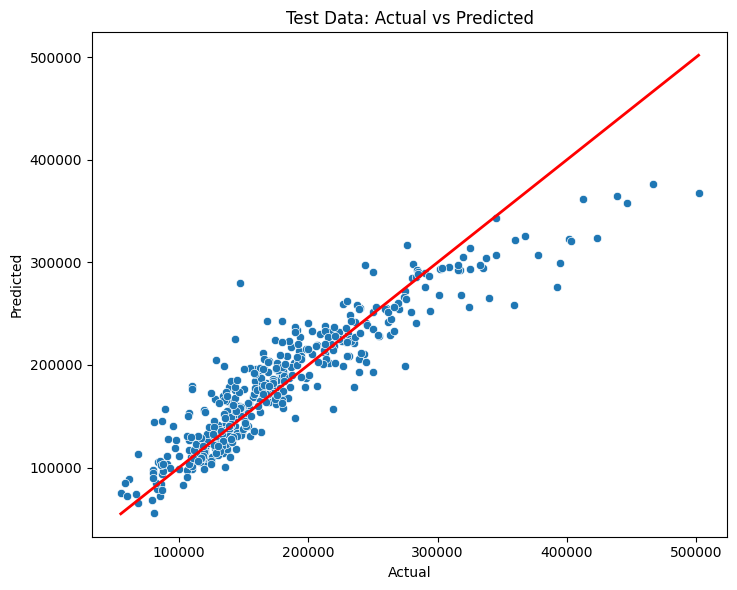

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data: Actual vs Predicted')

plt.tight_layout()
plt.show()

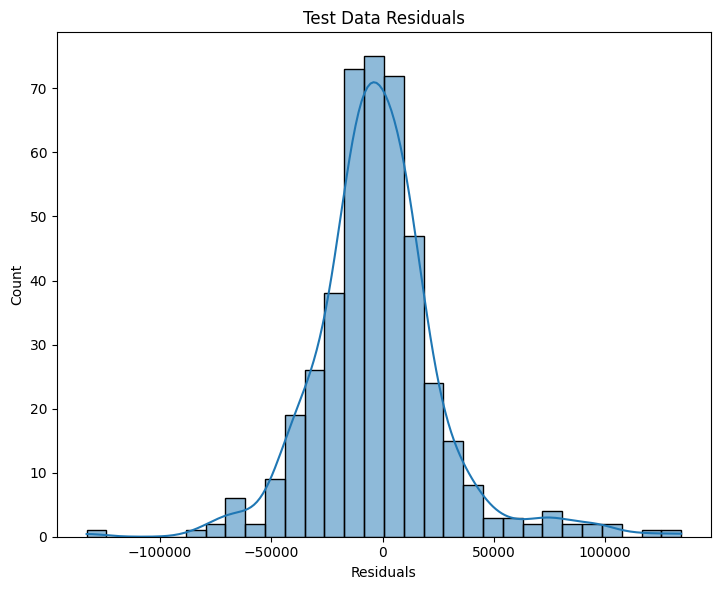

In [ ]:
plt.figure(figsize=(14,6))
plt.subplot(1, 2, 2)
sns.histplot(y_test - y_test_pred, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Test Data Residuals')

plt.tight_layout()
plt.show()

In [ ]:
# Cross-validation scores
cv_scores = cross_val_score(ridge, X_train, y_train, cv=5, scoring='r2')
print('Ridge:')
print(f'Cross-validation R^2 scores: {cv_scores}')
print(f'Average cross-validation R^2 score: {cv_scores.mean():.4f}')
print(f'Standard deviation of cross-validation R^2 scores: {cv_scores.std():.4f}')



Ridge:
Cross-validation R^2 scores: [0.83119602 0.42214477 0.82191105 0.72229155 0.81047251]
Average cross-validation R^2 score: 0.7216
Standard deviation of cross-validation R^2 scores: 0.1547


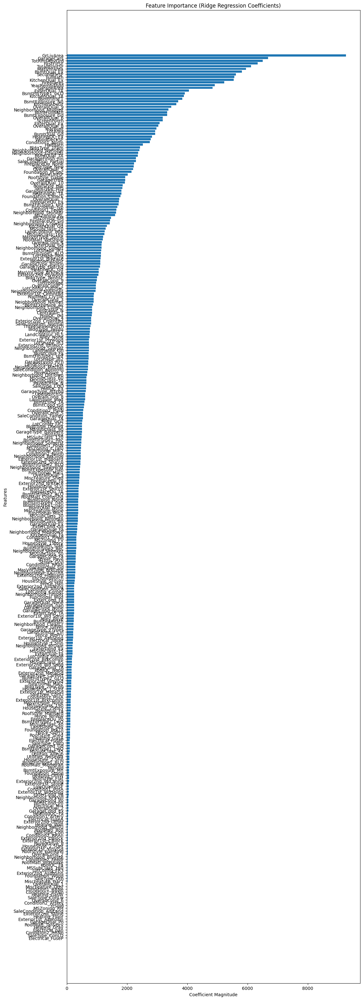

In [ ]:
# Extract coefficients and feature names
coef = ridge.named_steps['regressor'].coef_
feature_names = numeric_features.tolist() + list(ridge.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))

# Convert feature names and coefficients to a Series for sorting
feature_importances = pd.Series(coef, index=feature_names)

# Plotting feature importance (absolute coefficients)
plt.figure(figsize=(12, 40))
# Sort the Series by absolute coefficient values and plot
plt.barh(feature_importances.abs().sort_values().index, feature_importances.abs().sort_values())
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Features')
plt.title('Feature Importance (Ridge Regression Coefficients)')
plt.show()

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 3.1 MB/s eta 0:00:00


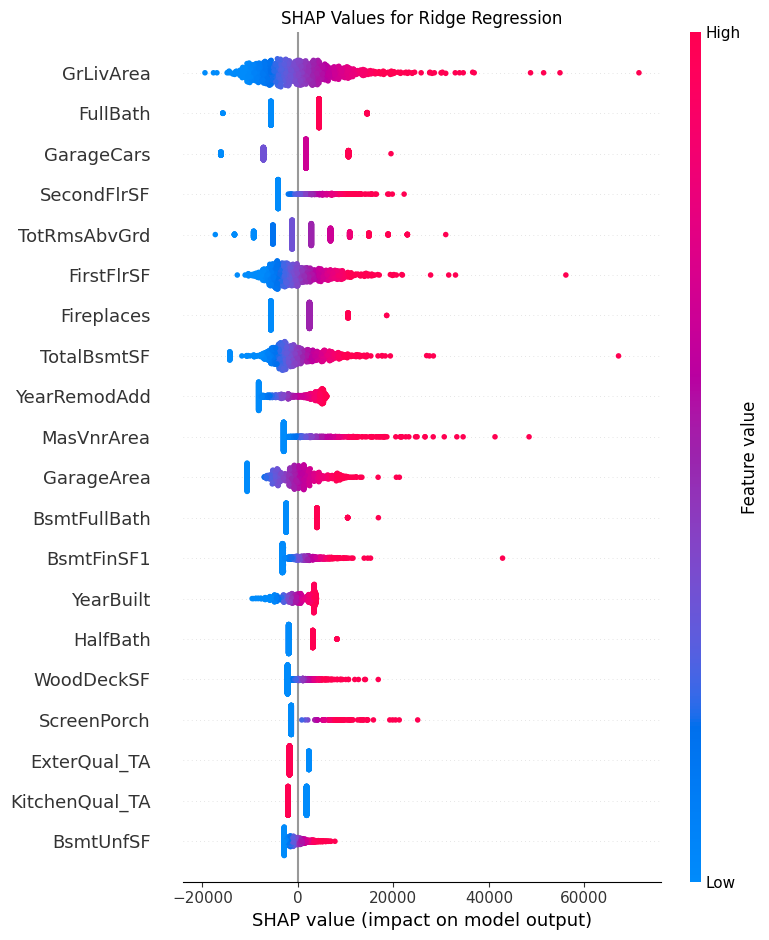

In [ ]:
import shap

# Create a SHAP explainer
explainer = shap.LinearExplainer(ridge.named_steps['regressor'],
                                 ridge.named_steps['preprocessor'].transform(X_train),
                                 feature_perturbation="interventional") # Changed to 'interventional'

# Calculate SHAP values for the training set
shap_values = explainer.shap_values(ridge.named_steps['preprocessor'].transform(X_train))

# Extract feature names
feature_names = numeric_features.tolist() + list(ridge.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))

# Create a DataFrame for SHAP values with feature names
shap_values_df = pd.DataFrame(shap_values, columns=feature_names)

# Summary plot
plt.title('SHAP Values for Ridge Regression')
shap.summary_plot(shap_values, features=ridge.named_steps['preprocessor'].transform(X_train), feature_names=feature_names)


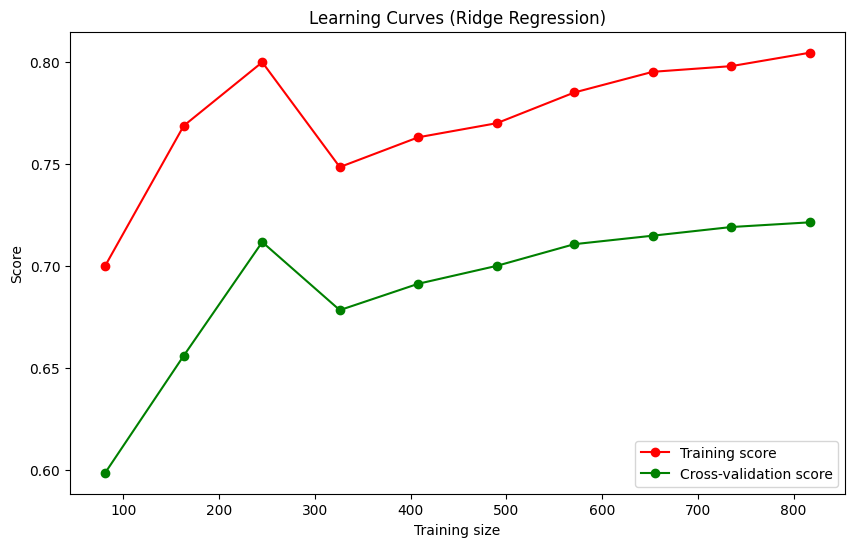

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    ridge, X_train, y_train, cv=5, scoring='r2', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.xlabel('Training size')
plt.ylabel('Score')
plt.title('Learning Curves (Ridge Regression)')
plt.legend(loc='best')
plt.show()


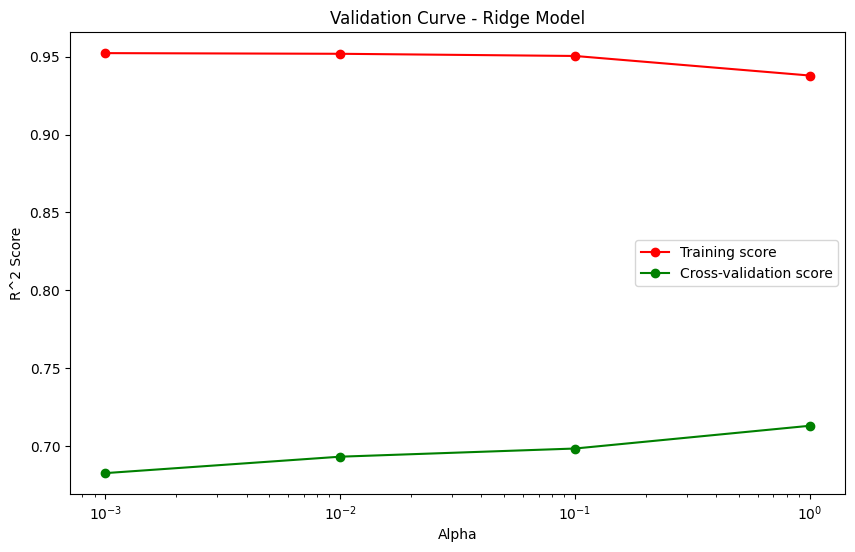

In [ ]:
from sklearn.model_selection import validation_curve
import numpy as np
import matplotlib.pyplot as plt

# Define the range for alpha
param_range = np.logspace(-3, 0, 4)  # Example range for a hyperparameter

# Calculate validation curve
train_scores, test_scores = validation_curve(
    ridge, X_train, y_train, param_name="regressor__alpha",
    param_range=param_range, cv=5, scoring='r2', n_jobs=-1
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - Ridge Model')
plt.xlabel('Alpha')
plt.ylabel('R^2 Score')
plt.xscale('log')
plt.legend(loc='best')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, RandomizedSearchCV

# Assuming X_train, X_test, y_train, y_test are defined and preprocessed

# Identify numerical and categorical columns
numerical_cols = X_train.select_dtypes(include=np.number).columns
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Create transformers for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a pipeline that includes preprocessing and the model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', GradientBoostingRegressor())
])

# Define the parameter distributions for RandomizedSearchCV
param_dist = {
    'model__n_estimators': [100, 200, 300, 400],
    'model__learning_rate': [0.01, 0.05, 0.1, 0.2],
    'model__max_depth': [3, 4, 5, 6],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 4],
    'model__max_features': ['auto', 'sqrt', 'log2', None]
}

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(
    pipeline, param_distributions=param_dist, n_iter=20,
    cv=5, scoring='r2', random_state=42, n_jobs=-1
)

# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLiv...
      dtype='object'))])),
                                             ('model',
                                              GradientBoostingRegressor())]),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'model__learning_rate': [0.01, 0.05,
                                                                 0.1, 0.2],
                                        'model__max_depth': [3, 4, 5, 6],
                                        'model__max_features': ['auto', 'sqrt',
                                                                'log2', None],
                                        'model__min_samples_leaf': [1, 2, 4],
                                        'model__min_samples_split': [2, 5, 10],
                                        'model__n_estimators': [100, 200, 300,
                                                                400]},
                   random_state=42, scoring='r2')

In [ ]:
# Print the best parameters found by RandomizedSearchCV
print("Best Parameters:", random_search.best_params_)

GradientBoosting = random_search.best_estimator_

# Predict on the training set using the best model
y_train_pred = GradientBoosting.predict(X_train)

# Calculate evaluation metrics on training data
r2_train = r2_score(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Print evaluation metrics for training data
print('Training Data Evaluation:')
print('R^2:', r2_train)
print('MAE:', mae_train)
print('MSE:', mse_train)
print('RMSE:', rmse_train)



Best Parameters: {'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__min_samples_leaf': 2, 'model__max_features': 'sqrt', 'model__max_depth': 4, 'model__learning_rate': 0.05}
Training Data Evaluation:
R^2: 0.9717073374431908
MAE: 10094.682461677441
MSE: 190007338.5695633
RMSE: 13784.314947416258


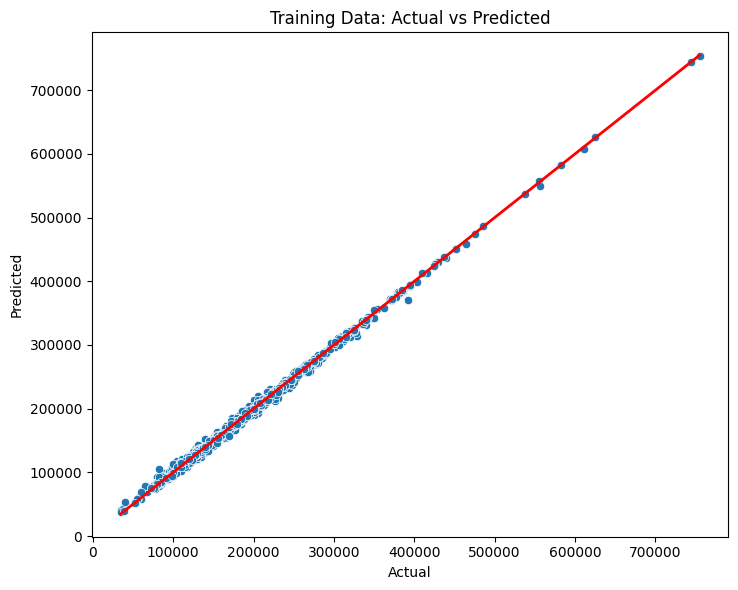

In [ ]:
# Plotting the actual vs predicted values for training data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='red', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Training Data: Actual vs Predicted')
plt.tight_layout()
plt.show()


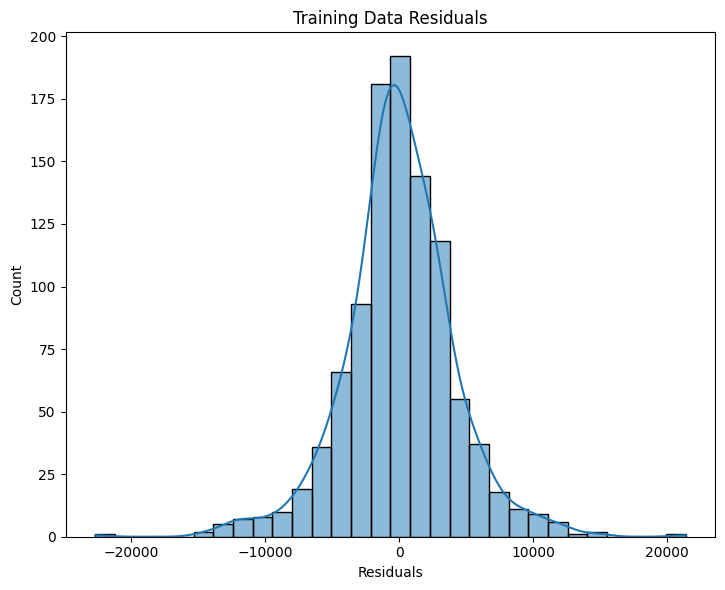

In [ ]:
# Plotting the residuals distribution for training data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(y_train - y_train_pred, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Training Data Residuals')
plt.tight_layout()
plt.show()

In [ ]:
# Predict on the test data
y_test_pred = GradientBoosting.predict(X_test)
acc_gb = r2_score(y_test, y_test_pred)
adj_r2_gb = 1 - (1 - acc_gb) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)
mae_gb = mean_absolute_error(y_test, y_test_pred)
mse_gb = mean_squared_error(y_test, y_test_pred)
rmse_gb = np.sqrt(mse_gb)

print('Test Data Evaluation:')
print('R^2:', acc_gb)
print('Adjusted R^2:', adj_r2_gb)
print('MAE:', mae_gb)
print('MSE:', mse_gb)
print('RMSE:', rmse_gb)

Test Data Evaluation:
R^2: 0.8859358735829352
Adjusted R^2: 0.8607652982003986
MAE: 16785.20620369803
MSE: 609349970.2215394
RMSE: 24685.015094618422


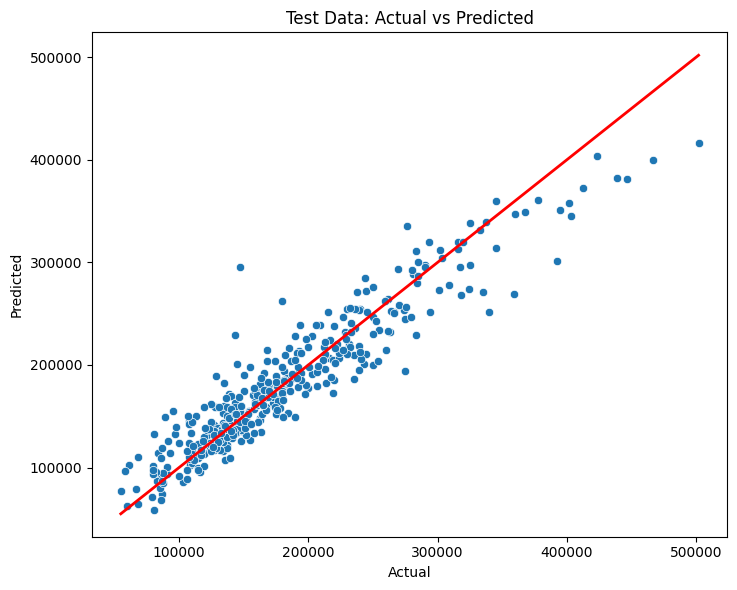

In [ ]:
# Plotting the actual vs predicted values for test data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Test Data: Actual vs Predicted')

plt.tight_layout()
plt.show()


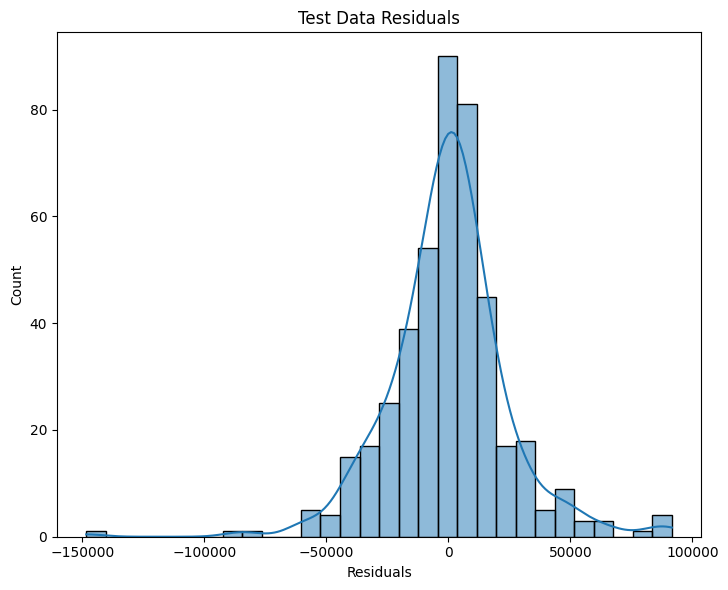

In [ ]:
# Plotting the residuals distribution for test data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.histplot(y_test - y_test_pred, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Test Data Residuals')

plt.tight_layout()
plt.show()


In [ ]:

# Cross-validation scores
cv_scores = cross_val_score(GradientBoosting, X_train, y_train, cv=5, scoring='r2')
# Calculate average R-squared score and standard deviation of R-squared scores
avg_r2_cv = np.mean(cv_scores)
std_r2_cv = np.std(cv_scores)

# Print cross-validation results
print("Gradient Boosting:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")

Gradient Boosting:
  Cross-validation R-squared scores: [0.87165957 0.5803523  0.89434805 0.85307349 0.91898481]
  Average R-squared score: 0.8237
  Standard deviation of R-squared scores: 0.1237


Feature Importance Plot: Helps you understand which features have the most influence on the predictions.

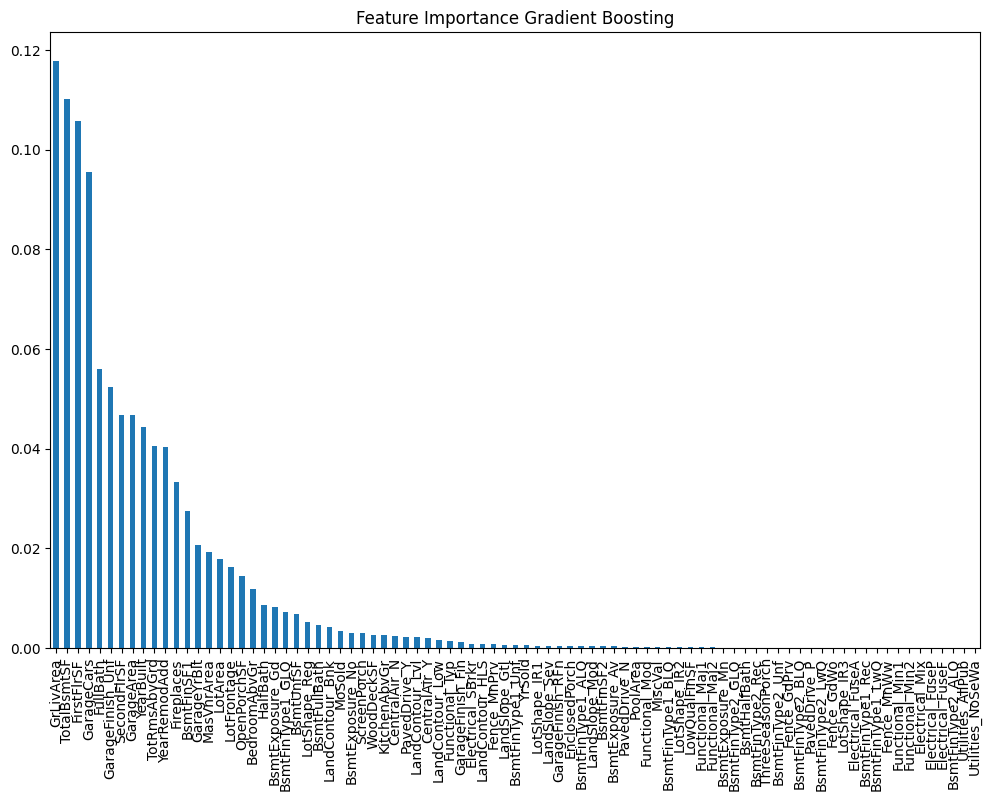

In [ ]:
importances = GradientBoosting.named_steps['model'].feature_importances_
feature_names = numerical_cols.tolist() + list(GradientBoosting.named_steps['preprocessor'].transformers_[1][1].named_steps['onehot'].get_feature_names_out(categorical_cols))
feature_importances = pd.Series(importances, index=feature_names)

plt.figure(figsize=(12, 8))
feature_importances.sort_values(ascending=False).plot(kind='bar')
plt.title('Feature Importance Gradient Boosting')
plt.show()


SHAP Values: Provide insights into how much each feature contributes to the prediction for each instance.

 93%|=================== | 952/1022 [00:13<00:00]       

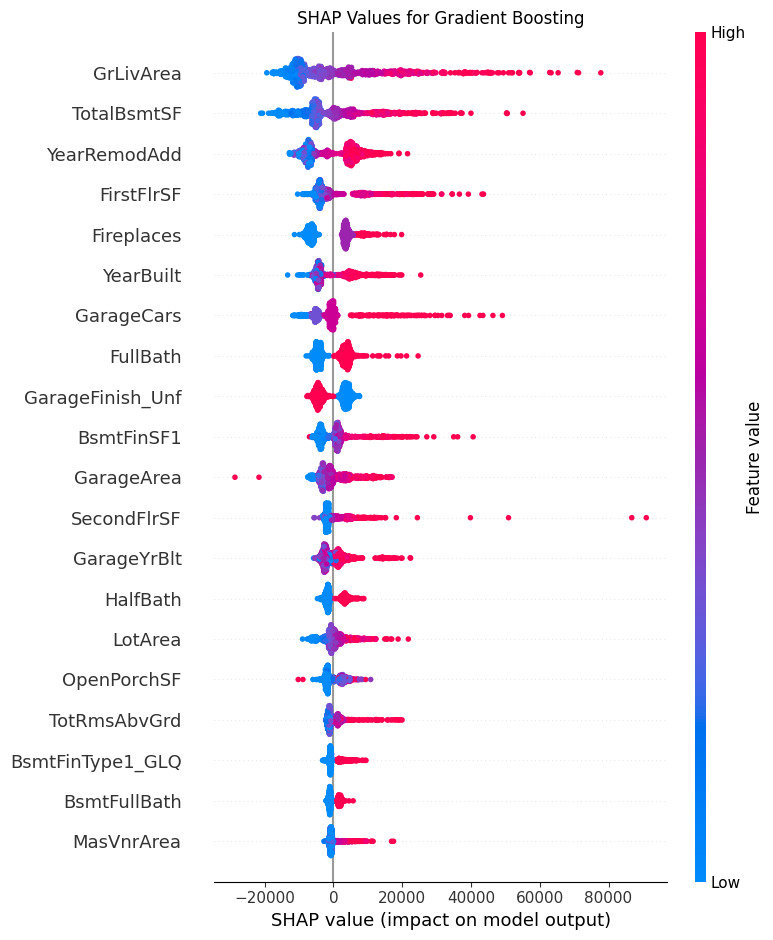

In [ ]:

import shap # Now you can import and use the library

explainer = shap.Explainer(GradientBoosting.named_steps['model'], GradientBoosting.named_steps['preprocessor'].transform(X_train))
shap_values = explainer.shap_values(GradientBoosting.named_steps['preprocessor'].transform(X_train))
plt.title('SHAP Values for Gradient Boosting')

shap.summary_plot(shap_values, GradientBoosting.named_steps['preprocessor'].transform(X_train), feature_names=feature_names)

Learning Curves: Useful for diagnosing if the model has a high bias (underfitting) or high variance (overfitting).

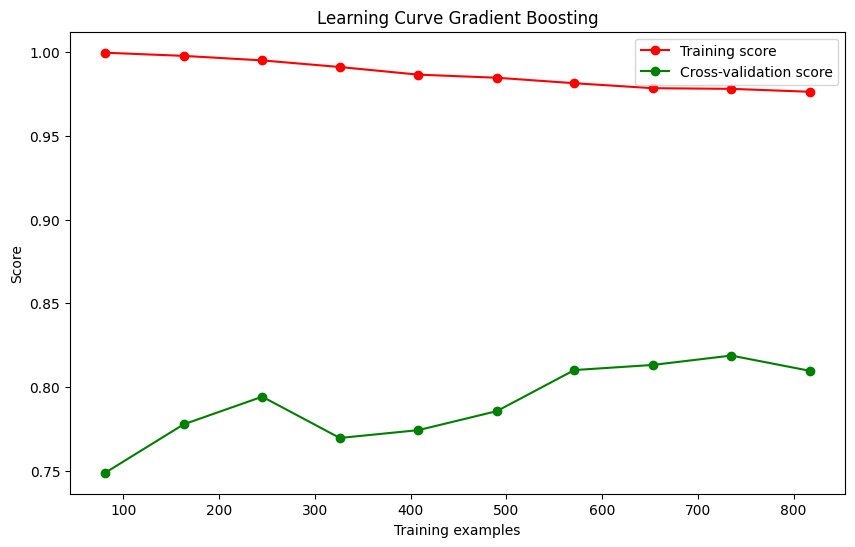

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(GradientBoosting, X_train, y_train, cv=5, scoring='r2', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Learning Curve Gradient Boosting')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.legend(loc='best')
plt.show()


Validation Curves: Help to identify the optimal value for a hyperparameter and understand how the hyperparameter affects model performance.

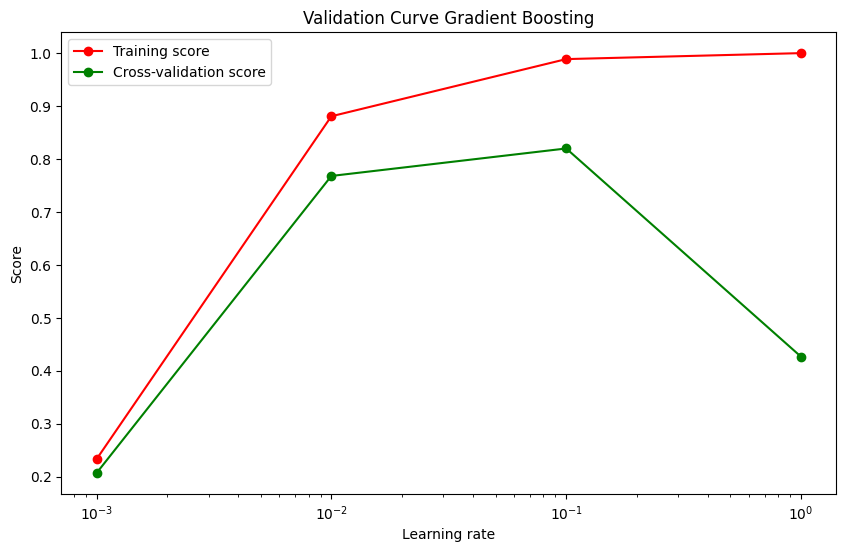

In [ ]:
from sklearn.model_selection import validation_curve

param_range = np.logspace(-3, 0, 4)  # Example range for a hyperparameter
train_scores, test_scores = validation_curve(GradientBoosting, X_train, y_train, param_name="model__learning_rate", param_range=param_range, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve Gradient Boosting')
plt.xlabel('Learning rate')
plt.ylabel('Score')
plt.xscale('log')
plt.legend(loc='best')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Lasso
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from scipy.stats import uniform


# Define columns for numeric and non-numeric transformations
numeric_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(exclude=['number']).columns

# Create transformers for numeric and categorical data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Create a pipeline that includes preprocessing and the model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', Lasso())
])

# Define the parameter grid for RandomizedSearchCV
param_distributions = {
    'model__alpha': uniform(loc=0, scale=1)  # alpha values between 0 and 1
}

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(pipeline, param_distributions, n_iter=100, cv=5, scoring='r2', n_jobs=-1, random_state=42)

# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHa...
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object'))])),
                                             ('model', Lasso())]),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'model__alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7ee7cc50de40>},
                   random_state=42, scoring='r2')

In [ ]:
# Get the best model
lasso = random_search.best_estimator_

# Predict on the training data
y_train_pred = lasso.predict(X_train)

# Model evaluation on training data
print('Training Data Evaluation:')
print('R^2:', r2_score(y_train, y_train_pred))
print('Adjusted R^2:', 1 - (1 - r2_score(y_train, y_train_pred)) * (len(y_train) - 1) / (len(y_train) - X_train.shape[1] - 1))
print('MAE:', mean_absolute_error(y_train, y_train_pred))
print('MSE:', mean_squared_error(y_train, y_train_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_train, y_train_pred)))

Training Data Evaluation:
R^2: 0.9449197603256546
Adjusted R^2: 0.940300504556787
MAE: 12419.599415014196
MSE: 369906852.2547832
RMSE: 19232.962648920817


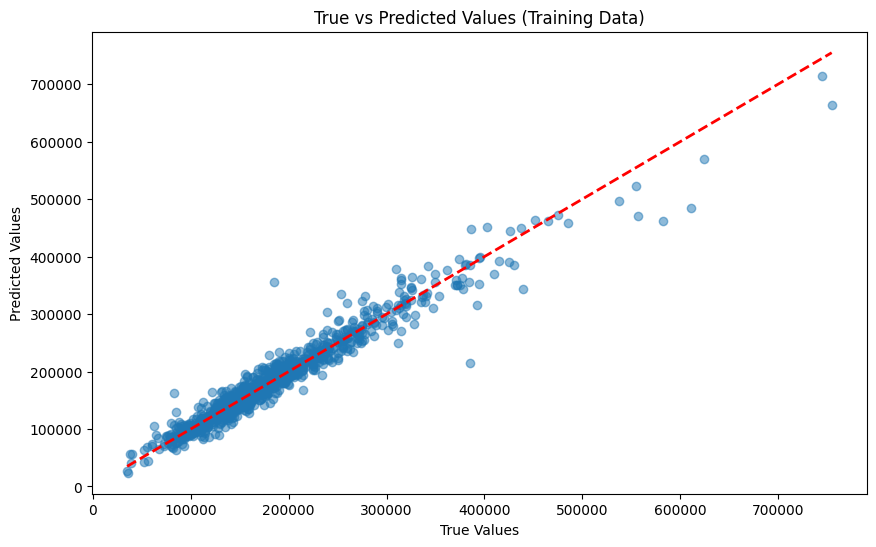

In [ ]:
# Scatter plot of true vs. predicted values for the training data
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], '--', color='red', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values (Training Data)')
plt.show()

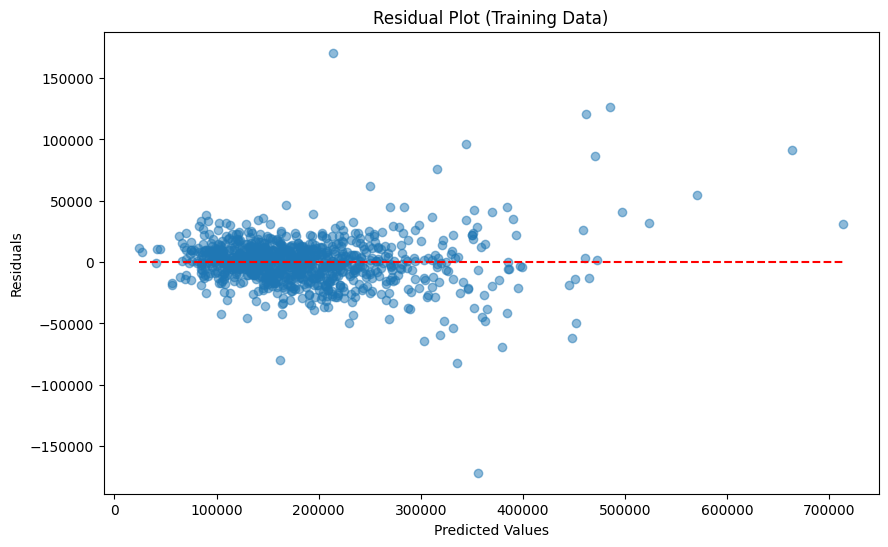

In [ ]:
# Residual plot for training data
train_residuals = y_train - y_train_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, train_residuals, alpha=0.5)
plt.hlines(0, y_train_pred.min(), y_train_pred.max(), colors='red', linestyles='dashed')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot (Training Data)')
plt.show()

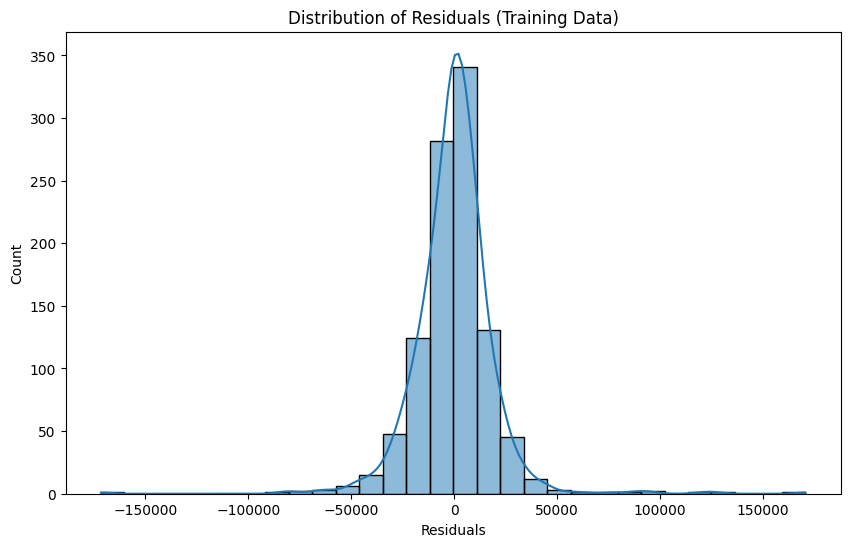

In [ ]:

# Distribution plot of residuals for training data
plt.figure(figsize=(10, 6))
sns.histplot(train_residuals, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Distribution of Residuals (Training Data)')
plt.show()

In [ ]:
# Predict on the test data
y_test_pred = lasso.predict(X_test)

# Calculate evaluation metrics for the test data
acc_la = r2_score(y_test, y_test_pred)
adj_r2_la = 1 - (1 - acc_la) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)
mae_la = mean_absolute_error(y_test, y_test_pred)
mse_la = mean_squared_error(y_test, y_test_pred)
rmse_la = np.sqrt(mse_la)

# Print the evaluation metrics for Lasso regression on test data
print('Test Data Evaluation:')
print('R^2:', acc_la)
print('Adjusted R^2:', adj_r2_la)
print('MAE:', mae_la)
print('MSE:', mse_la)
print('RMSE:', rmse_la)


Test Data Evaluation:
R^2: 0.8740546698896015
Adjusted R^2: 0.8462622646417761
MAE: 17767.518935636646
MSE: 672821381.8225652
RMSE: 25938.800701315493


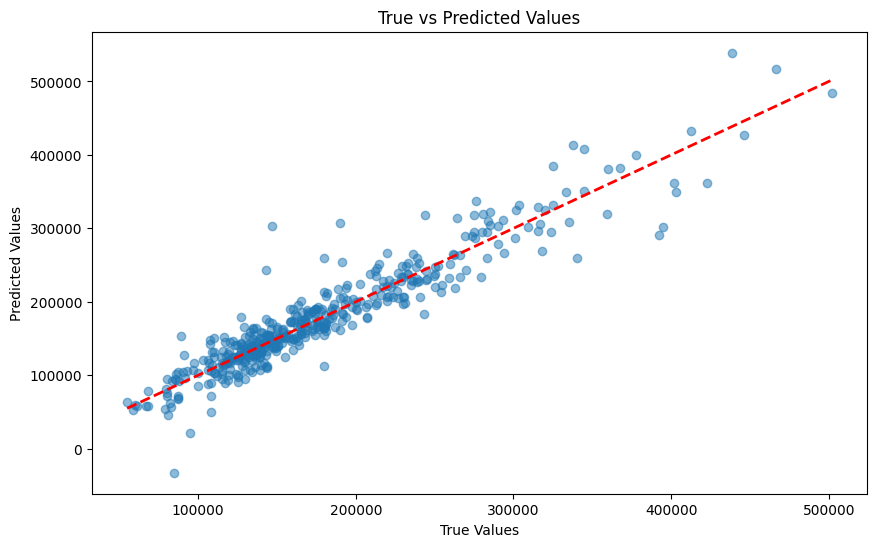

In [ ]:
# Scatter plot of true vs. predicted values for the test data
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values')
plt.show()

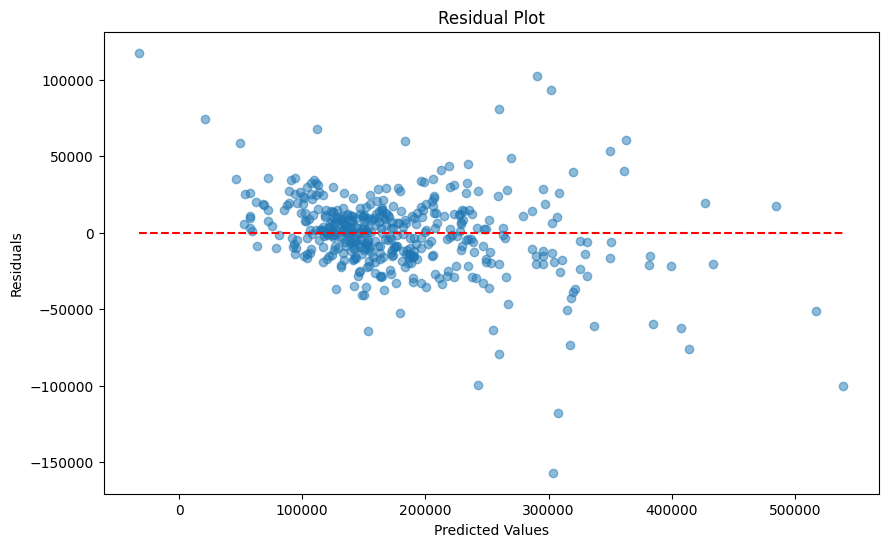

In [ ]:
# Residual plot
residuals = y_test - y_test_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred, residuals, alpha=0.5)
plt.hlines(0, y_test_pred.min(), y_test_pred.max(), colors='red', linestyles='dashed')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

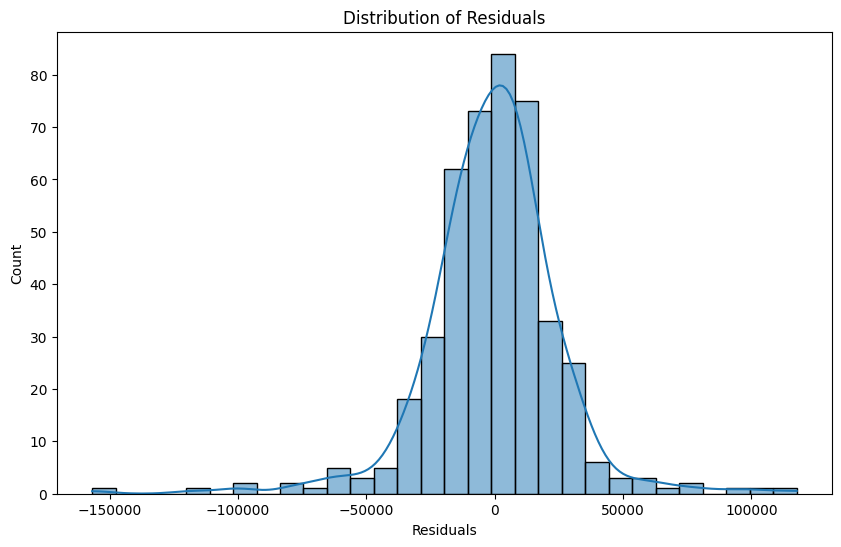

In [ ]:
# Distribution plot of residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.xlabel('Residuals')
plt.title('Distribution of Residuals')
plt.show()

In [ ]:
# Perform cross-validation
cv_scores = cross_val_score(lasso, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print('Cross-validation R-squared scores:', cv_scores)
print('Average R-squared score:', np.mean(cv_scores))
print('Standard deviation of R-squared scores:', np.std(cv_scores))

Cross-validation R-squared scores: [0.86282406 0.32865897 0.90764447 0.68405715 0.90077864]
Average R-squared score: 0.7367926572757895
Standard deviation of R-squared scores: 0.21969059861375648


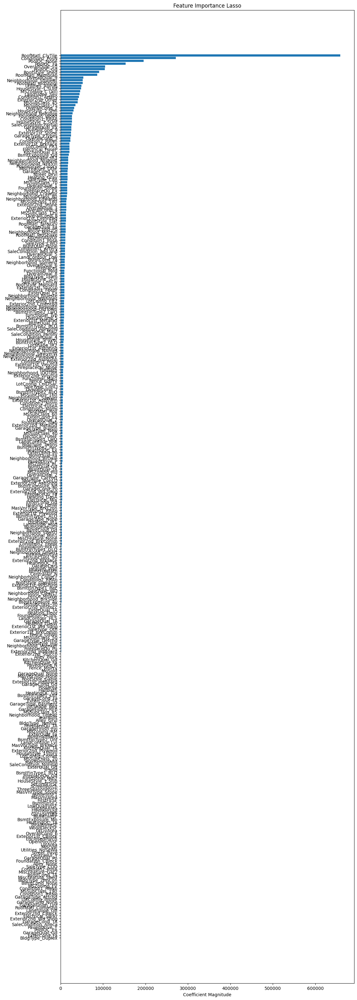

In [ ]:
# Extract the feature names after one-hot encoding
feature_names = np.concatenate([numeric_features, random_search.best_estimator_.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot'].get_feature_names_out(categorical_features)])

# Extract the coefficients
coefficients = lasso.named_steps['model'].coef_

# Plot feature importance
importance = pd.Series(coefficients, index=feature_names).sort_values() # Use the Pandas Series 'importance'

plt.figure(figsize=(12, 40))
# Use the Pandas Series 'importance' to access .abs()
plt.barh(importance.abs().sort_values().index, importance.abs().sort_values())
plt.title('Feature Importance Lasso')
plt.xlabel('Coefficient Magnitude')
plt.show()

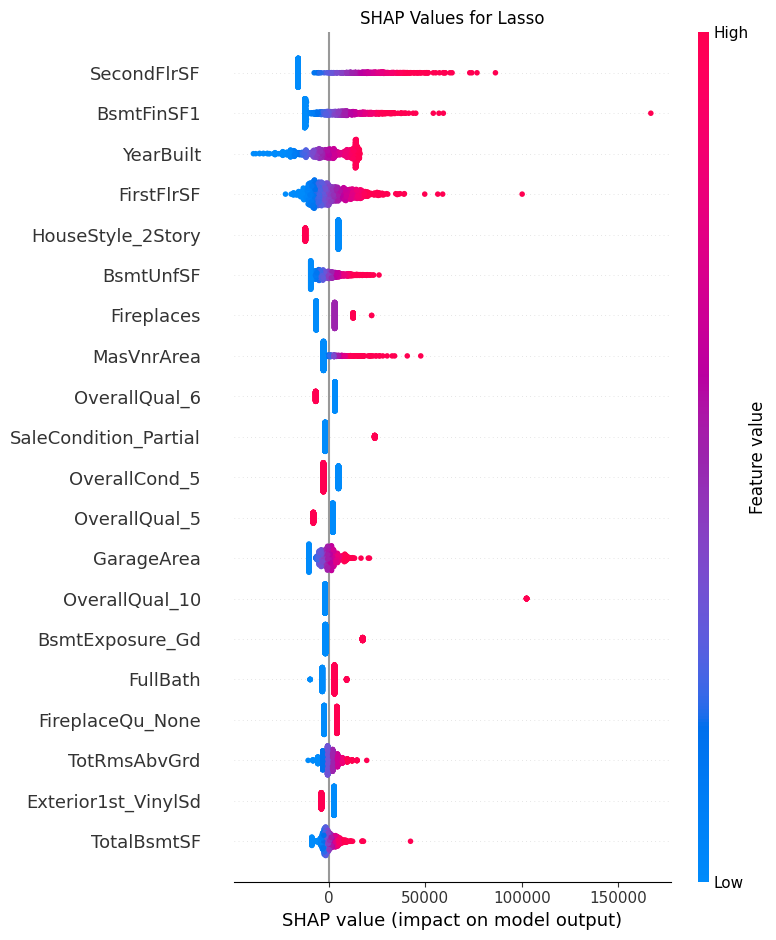

In [ ]:
import shap

# Create an explainer object
explainer = shap.Explainer(lasso.named_steps['model'], lasso.named_steps['preprocessor'].transform(X_train))

# Calculate SHAP values for the training data
shap_values = explainer(lasso.named_steps['preprocessor'].transform(X_train))
# Summary plot of SHAP values
plt.title('SHAP Values for Lasso')
shap.summary_plot(shap_values, lasso.named_steps['preprocessor'].transform(X_train), feature_names=feature_names)



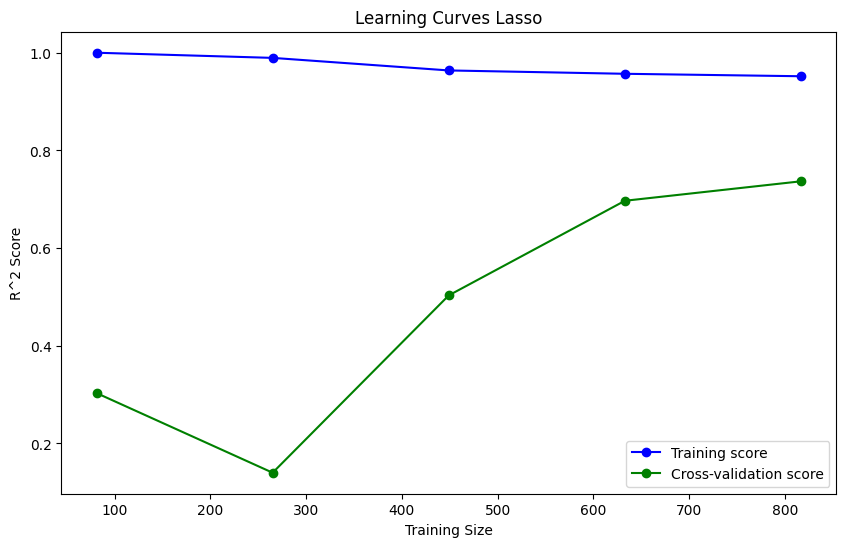

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(lasso, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Cross-validation score')
plt.xlabel('Training Size')
plt.ylabel('R^2 Score')
plt.title('Learning Curves Lasso')
plt.legend(loc='best')
plt.show()


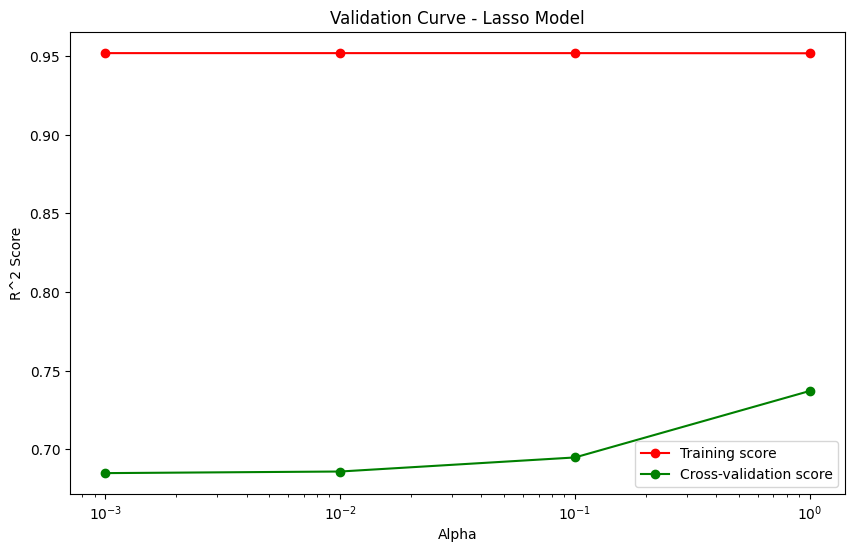

In [ ]:
# Define the range for alpha
param_range = np.logspace(-3, 0, 4)

# Calculate validation curve
train_scores, test_scores = validation_curve(lasso, X_train, y_train, param_name="model__alpha", param_range=param_range, cv=5, scoring='r2', n_jobs=-1)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - Lasso Model')
plt.xlabel('Alpha')
plt.ylabel('R^2 Score')
plt.xscale('log')
plt.legend(loc='best')
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

# Assuming X_train, X_test, y_train, y_test are already defined

# Identify numeric and categorical features
numeric_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(exclude=['number']).columns

# Create transformers for numeric and categorical features
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore', sparse=False)

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', MLPRegressor(hidden_layer_sizes=(200, 100), activation='relu', solver='adam',
                               alpha=0.0001, batch_size='auto', learning_rate='constant',
                               learning_rate_init=0.001, max_iter=500, shuffle=True, random_state=42))
])

# Fit the pipeline on training data
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'To...
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object'))])),
                ('regressor',
                 MLPRegressor(hidden_layer_sizes=(200, 100), max_iter=500,
                              random_state=42))])

In [ ]:
# Predicting Training data with the pipeline
y_train_pred = pipeline.predict(X_train)

# Model Evaluation on Training Data
r2_train = r2_score(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Calculate adjusted R-squared for training data
n_train = len(y_train)
p_train = X_train.shape[1]  # Adjusted R^2 should consider all features in X_train
adj_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Print the evaluation metrics for training data
print('Training Data Evaluation:')
print('R^2:', r2_train)
print('Adjusted R^2:', adj_r2_train)
print('MAE:', mae_train)
print('MSE:', mse_train)
print('RMSE:', rmse_train)


Training Data Evaluation:
R^2: 0.8573795548576235
Adjusted R^2: 0.8454188168892076
MAE: 16427.448970987865
MSE: 957807740.883245
RMSE: 30948.469120188238


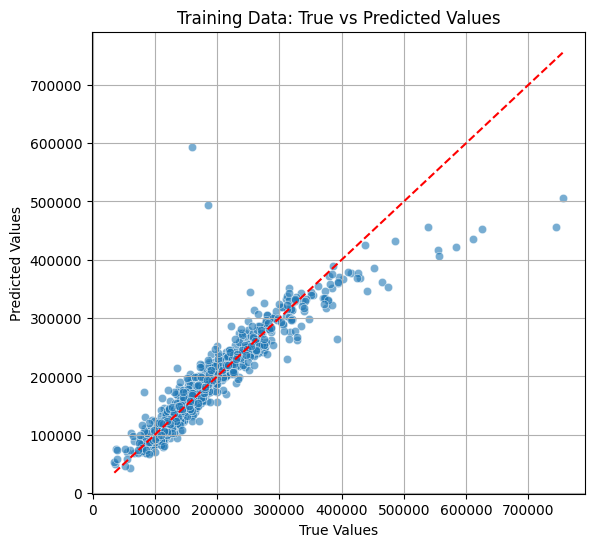

In [ ]:
# Plot true vs predicted values for training data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred, alpha=0.6)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Training Data: True vs Predicted Values')
plt.grid(True)
plt.show()

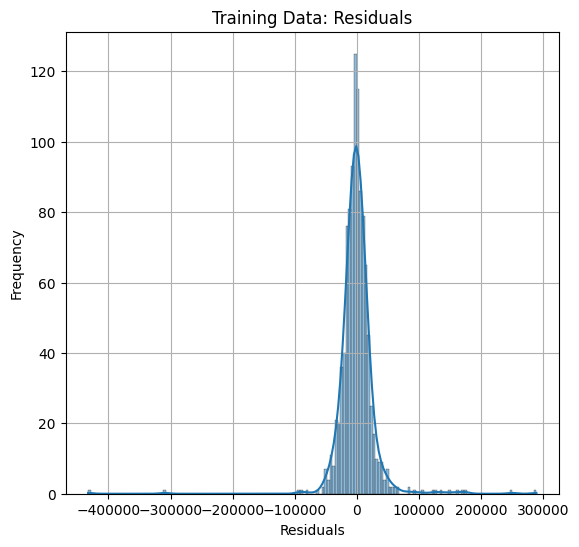

In [ ]:
# Plot residuals for training data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(y_train - y_train_pred, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Training Data: Residuals')
plt.grid(True)
plt.show()

In [ ]:
# Predicting Test data with the pipeline
y_test_pred = pipeline.predict(X_test)
# Calculate R-squared for MLP model
acc_mlp = r2_score(y_test, y_test_pred)


# Model Evaluation on Test Data
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

# Calculate adjusted R-squared for test data
n_test = len(y_test)
p_test = X_test.shape[1]  # Adjusted R^2 should consider all features in X_test
adj_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Print the evaluation metrics for test data
print('Test Data Evaluation:')
print('R^2:', r2_test)
print('Adjusted R^2:', adj_r2_test)
print('MAE:', mae_test)
print('MSE:', mse_test)
print('RMSE:', rmse_test)

Test Data Evaluation:
R^2: 0.8884964546362819
Adjusted R^2: 0.8638909236761318
MAE: 17236.733698143955
MSE: 595670910.5766026
RMSE: 24406.370286804275


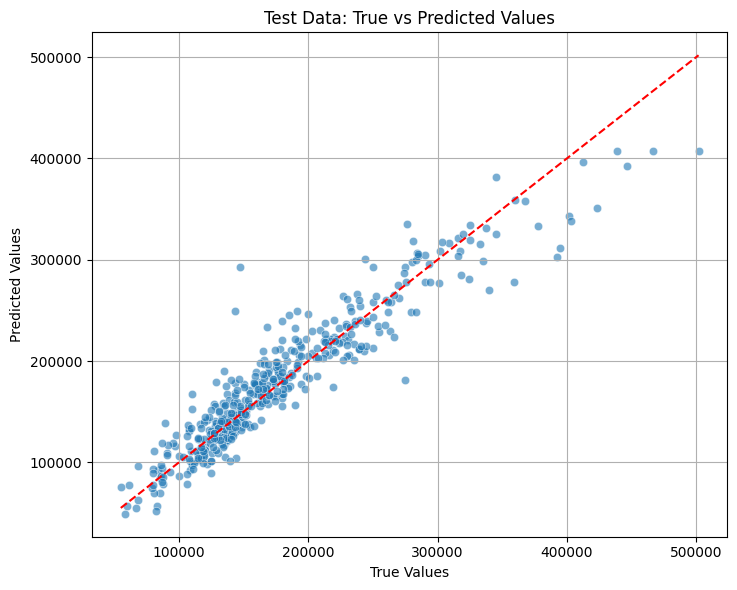

In [ ]:
# Plot true vs predicted values for test data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Test Data: True vs Predicted Values')
plt.grid(True)
plt.tight_layout()

plt.show()

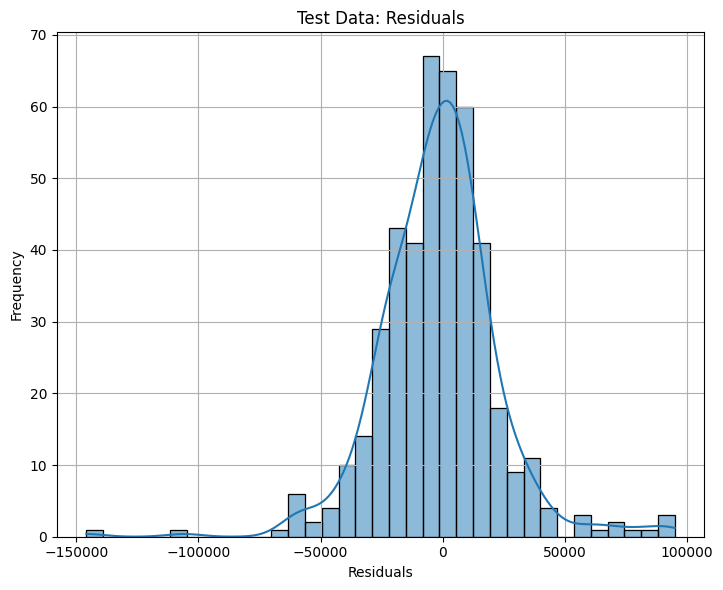

In [ ]:
# Plot residuals for test data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.histplot(y_test - y_test_pred, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Test Data: Residuals')
plt.grid(True)
plt.tight_layout()

plt.show()

In [ ]:
# Generate cross-validation scores
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print('Cross-validation R-squared scores:', cv_scores)
print('Average R-squared score:', np.mean(cv_scores))
print('Standard deviation of R-squared scores:', np.std(cv_scores))

Cross-validation R-squared scores: [0.87348648 0.32108931 0.87405446 0.75180298 0.85529407]
Average R-squared score: 0.7351454589739991
Standard deviation of R-squared scores: 0.21193848350217775


Since the MLPRegressor is a neural network model, it doesn't have direct feature importances like tree-based models or linear models. However, we can use permutation importance to understand the importance of features.

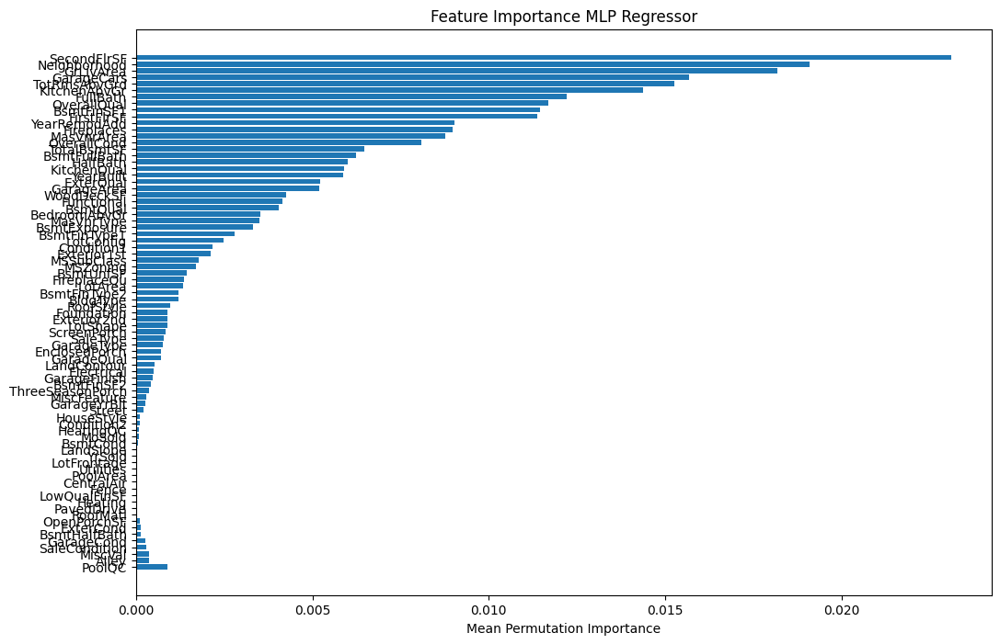

In [ ]:
from sklearn.inspection import permutation_importance
# Compute permutation importances
result = permutation_importance(pipeline, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Get the names of the original features before one-hot encoding
feature_names = X_train.columns  # Use original feature names

# Create a Pandas Series for the importances
importances = pd.Series(result.importances_mean, index=feature_names).sort_values()

# Plot the feature importances
plt.figure(figsize=(12, 8))  # Adjust figure size as needed
plt.barh(importances.index, importances.abs())
plt.title('Feature Importance MLP Regressor')
plt.xlabel('Mean Permutation Importance')
plt.show()

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=e7672ba51eac6da5efe3552e6df592ce0dbdb953d13cb8f57e7a789b1a9c2a52
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


LIME (Local Interpretable Model-agnostic Explanations):

LIME, or Local Interpretable Model-agnostic Explanations, is a technique used to explain individual predictions of machine learning models.

In [ ]:
import lime
import lime.lime_tabular
import pandas as pd

# Apply preprocessing to the data
preprocessed_X_train = pipeline.named_steps['preprocessor'].transform(X_train)
preprocessed_X_test = pipeline.named_steps['preprocessor'].transform(X_test)

# Extract feature names after preprocessing
numeric_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(exclude=['number']).columns
encoded_categorical_features = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
feature_names = np.concatenate([numeric_features, encoded_categorical_features])

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(preprocessed_X_train,
                                                   feature_names=feature_names,
                                                   mode='regression',
                                                   verbose=True)

# Choose an instance to explain (e.g., first instance in test data)
instance_idx = 0
instance = preprocessed_X_test[instance_idx]  # Use preprocessed data

# Define a prediction function that handles preprocessing
def predict_fn(x):
    # Initialize an empty DataFrame to hold the inverse transformed data
    df_unprocessed = pd.DataFrame(columns=X_test.columns)

    # Inverse transform numeric features
    numeric_cols = X_train.select_dtypes(include=['number']).columns
    numeric_transformer = pipeline.named_steps['preprocessor'].named_transformers_['num']
    df_unprocessed[numeric_cols] = numeric_transformer.inverse_transform(x[:, :len(numeric_cols)])

    # Inverse transform categorical features
    categorical_cols = X_train.select_dtypes(exclude=['number']).columns
    categorical_transformer = pipeline.named_steps['preprocessor'].named_transformers_['cat']
    df_unprocessed[categorical_cols] = categorical_transformer.inverse_transform(x[:, len(numeric_cols):])

    return pipeline.predict(df_unprocessed)

# Explain the prediction using LIME with the custom prediction function
exp = explainer.explain_instance(instance, predict_fn, num_features=len(feature_names))

# Visualize feature importances (local explanations)

exp.show_in_notebook(show_table=True, show_all=False)


Intercept 118372.64466881243
Prediction_local [225581.99180506]
Right: 225104.5839568346


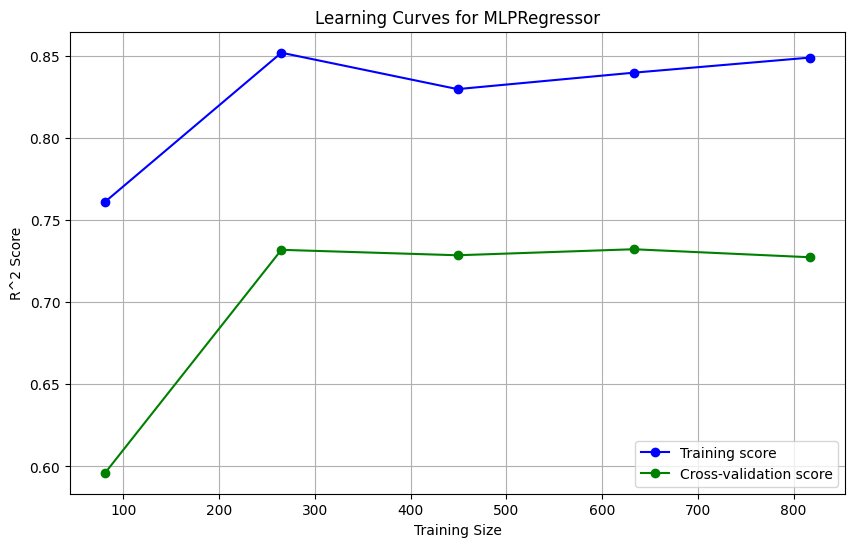

In [ ]:
# Compute learning curves
train_sizes, train_scores, test_scores = learning_curve(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)

# Calculate mean scores across folds
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Cross-validation score')
plt.xlabel('Training Size')
plt.ylabel('R^2 Score')
plt.title('Learning Curves for MLPRegressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()

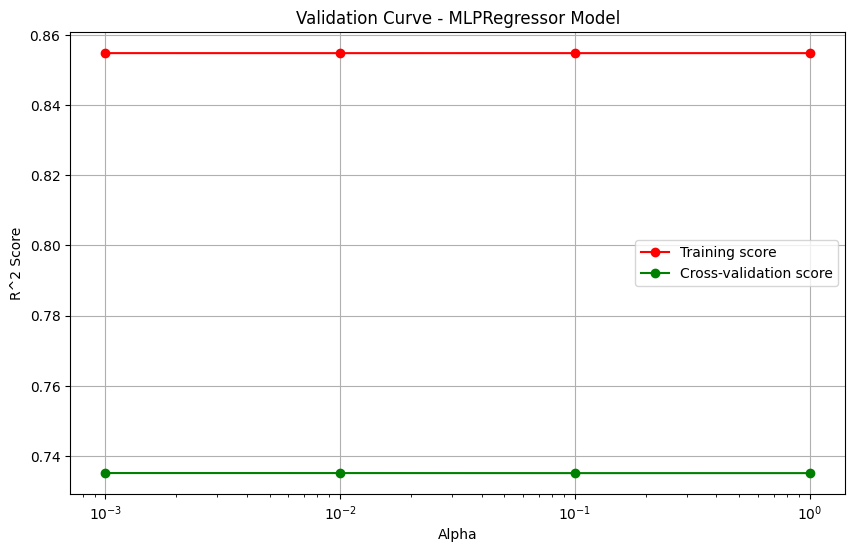

In [ ]:
from sklearn.model_selection import validation_curve
import matplotlib.pyplot as plt
import numpy as np

# Define the range for alpha (adjust as needed)
param_range = np.logspace(-3, 0, 4)

# Calculate validation curve for MLPRegressor
train_scores, test_scores = validation_curve(pipeline, X_train, y_train,
                                             param_name="regressor__alpha",  # Adjust this based on MLPRegressor hyperparameters
                                             param_range=param_range,
                                             cv=5, scoring='r2', n_jobs=-1)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - MLPRegressor Model')
plt.xlabel('Alpha')  # Adjust xlabel based on the hyperparameter being tuned
plt.ylabel('R^2 Score')
plt.xscale('log')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
from sklearn import metrics

# Assuming X_train, X_test, y_train, y_test are already defined

# Identify numeric columns
numeric_cols = X_train.select_dtypes(include=np.number).columns

# Create transformers
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Bundle preprocessing for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols)
    ])

# Create a pipeline with preprocessing and model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'preprocessor__num__imputer__strategy': ['mean', 'median'],
    # Add other hyperparameters specific to preprocessing or the model if needed
}

# Create RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_grid,
                                   n_iter=50, cv=5, scoring='r2', verbose=2, random_state=42, n_jobs=-1)

# Fit RandomizedSearchCV on training data
random_search.fit(X_train, y_train)



Fitting 5 folds for each of 2 candidates, totalling 10 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLiv...
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ThreeSeasonPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'],
      dtype='object'))])),
                                             ('regressor',
                                              LinearRegression())]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'preprocessor__num__imputer__strategy': ['mean',
                                                                                 'median']},
                   random_state=42, scoring='r2', verbose=2)

In [ ]:
# Evaluate on training set with the best model found by RandomizedSearchCV
best_model = random_search.best_estimator_
y_train_pred = best_model.predict(X_train)

In [ ]:
# Print the intercept
print(f"Intercept: {random_search.best_estimator_.named_steps['regressor'].intercept_}")

# Get the preprocessed data from the pipeline
X_train_imputed = random_search.best_estimator_.named_steps['preprocessor'].transform(X_train)
# Convert the numpy array to a pandas DataFrame to get column names
X_train_imputed = pd.DataFrame(X_train_imputed, columns=numeric_cols) # Assuming numeric_cols is defined as in your previous code

# Create a DataFrame for coefficients, using the imputed training set columns
coefficients = pd.DataFrame({
    'Attribute': X_train_imputed.columns,  # Use columns from the imputed data
    'Coefficients': random_search.best_estimator_.named_steps['regressor'].coef_
})

# Display coefficients
print(coefficients)

Intercept: 182073.58877324118
           Attribute  Coefficients
0        LotFrontage  1.832802e+03
1            LotArea  2.972160e+03
2          YearBuilt  1.076611e+04
3       YearRemodAdd  8.945170e+03
4         MasVnrArea  7.526285e+03
5         BsmtFinSF1 -1.866541e+16
6         BsmtFinSF2 -5.712885e+15
7          BsmtUnfSF -1.773546e+16
8        TotalBsmtSF  1.827675e+16
9         FirstFlrSF  7.701601e+15
10       SecondFlrSF  8.429344e+15
11      LowQualFinSF  1.004686e+15
12         GrLivArea -1.038259e+16
13      BsmtFullBath  6.554461e+03
14      BsmtHalfBath  8.970145e+02
15          FullBath  5.313935e+03
16          HalfBath -6.596599e+02
17      BedroomAbvGr -9.832376e+03
18      KitchenAbvGr -8.364170e+03
19      TotRmsAbvGrd  1.296922e+04
20        Fireplaces  5.487330e+03
21       GarageYrBlt -1.904378e+03
22        GarageCars  1.178929e+04
23        GarageArea  1.547153e+03
24        WoodDeckSF  2.940265e+03
25       OpenPorchSF -1.041233e+03
26     EnclosedPorch  1.1

In [ ]:
# Evaluate on training set with the best model found by RandomizedSearchCV
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_train_imputed) # Use 'best_model' instead of 'lm'
r2 = metrics.r2_score(y_train, y_pred)
adj_r2 = 1 - (1 - r2) * (len(y_train) - 1) / (len(y_train) - X_train.shape[1] - 1)
mae = metrics.mean_absolute_error(y_train, y_pred)
mse = metrics.mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)

In [ ]:
# Calculate evaluation metrics
r2_train = r2_score(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Print evaluation metrics on training set
print('Training Set Evaluation:')
print('R^2:', r2_train)
print('MAE:', mae_train)
print('MSE:', mse_train)
print('RMSE:', rmse_train)


Training Set Evaluation:
R^2: 0.7623037575879633
MAE: 24237.027246952042
MSE: 1596316017.2009778
RMSE: 39953.92367716815


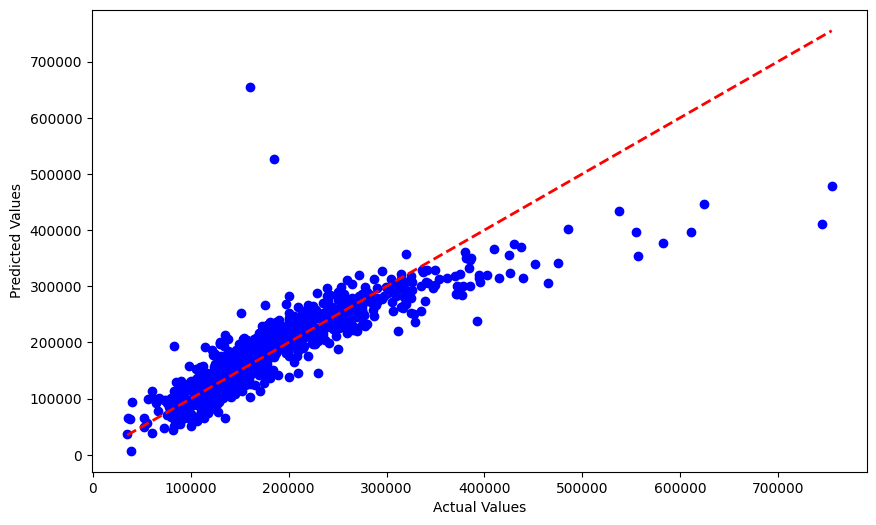

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, color='blue', label='Actual vs Predicted')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], c='red', linestyle='--', lw=2)  # Diagonal line

plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

plt.tight_layout()
plt.show()


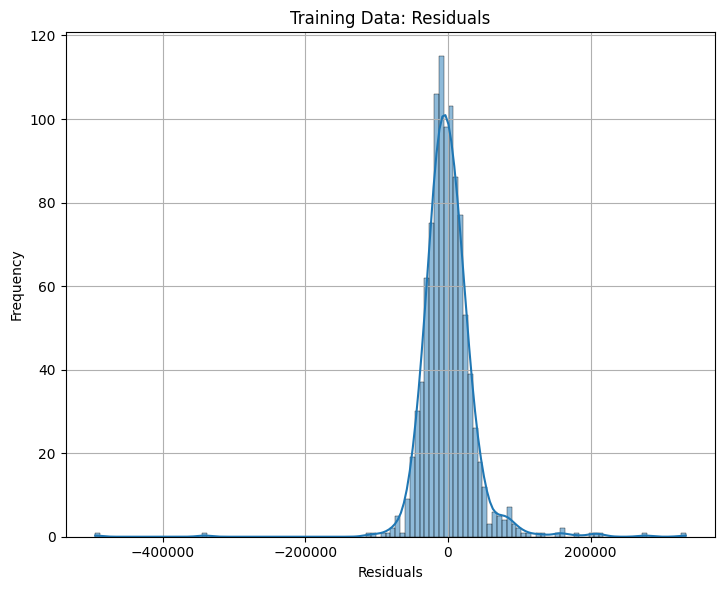

In [ ]:
import seaborn as sns

# Plot residuals for training data
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(y_train - y_train_pred, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Training Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:

# Calculating R-squared
r2 = metrics.r2_score(y_test, y_test_pred)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)


# Mean Absolute Error (MAE)
mae = metrics.mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
mse = metrics.mean_squared_error(y_test, y_test_pred)
acc_linreg = metrics.r2_score(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f'R^2: {r2:.4f}')
print(f'Adjusted R^2: {adjusted_r2:.4f}')
print(f'MAE: {mae:.4f}')
print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')


R^2: 0.8885
Adjusted R^2: 0.8639
MAE: 17236.7337
MSE: 595670910.5766
RMSE: 24406.3703


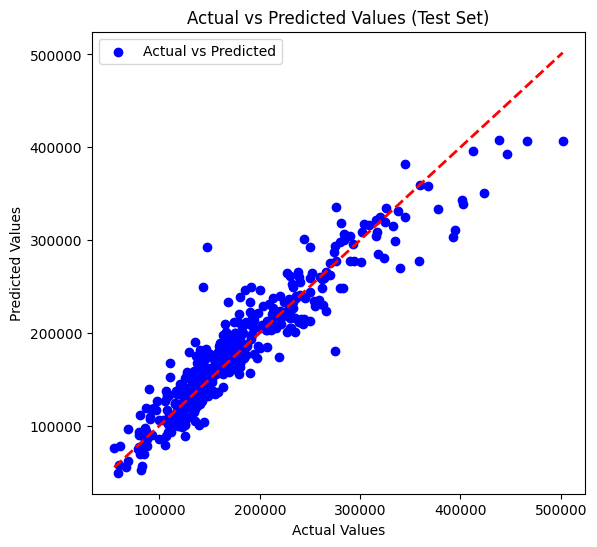

In [ ]:
# Plotting actual vs predicted values for test data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_test_pred, color='blue', label='Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], c='red', linestyle='--', lw=2)  # Diagonal line
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values (Test Set)')
plt.legend()

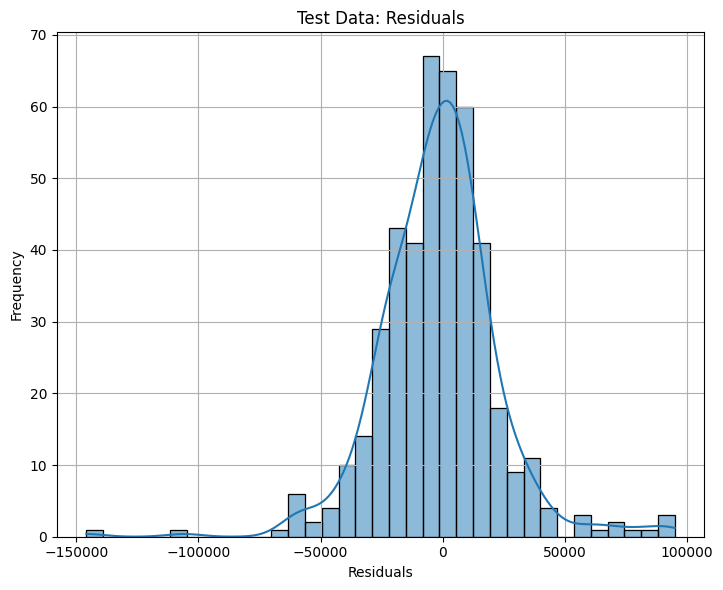

In [ ]:
plt.figure(figsize=(14, 6))
# Plot residuals for test data
plt.subplot(1, 2, 2)
sns.histplot(y_test - y_test_pred, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Test Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Perform cross-validation on the training set using the best model
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-validation R-squared scores:', cv_scores)

# Calculate average R-squared score and standard deviation of R-squared scores
avg_r2_cv = np.mean(cv_scores)
std_r2_cv = np.std(cv_scores)

# Print average and standard deviation of R-squared scores
print('Average R-squared score (CV):', avg_r2_cv)
print('Standard deviation of R-squared scores (CV):', std_r2_cv)

Cross-validation R-squared scores: [0.80250458 0.11242798 0.79247263 0.59830633 0.78716177]
Average R-squared score (CV): 0.6185746591384145
Standard deviation of R-squared scores (CV): 0.2642300509967709


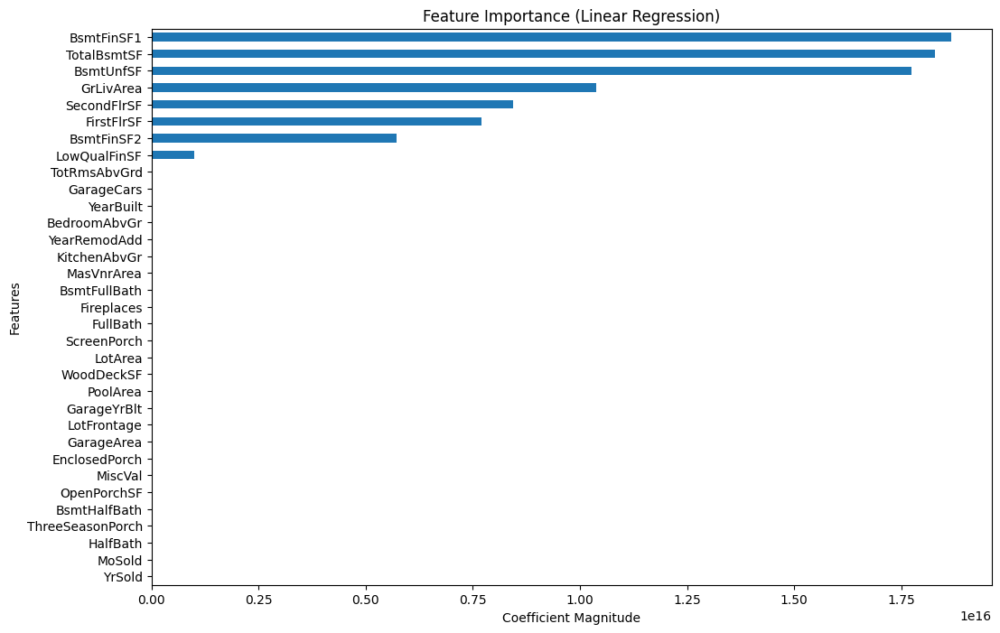

In [ ]:
# Assuming 'numeric_cols' and 'categorical_cols' are defined
numeric_cols = X_train.select_dtypes(include=np.number).columns.tolist()
categorical_cols = X_train.select_dtypes(exclude=np.number).columns.tolist()

# Access the estimator within the pipeline
# Replace 'correct_step_name' with the actual name of your linear regression step in the pipeline
linear_model = best_model.named_steps['regressor']  # Assuming 'regressor' is the name of your linear regression step

# Extract coefficients from the LinearRegression model
coefficients = linear_model.coef_

# Use only numeric feature names for the index, as coefficients correspond to them
feature_names = numeric_cols

# Create a Pandas Series for feature importances (coefficients)
importance = pd.Series(coefficients, index=feature_names)

# Plot feature importances using barh for horizontal bars
plt.figure(figsize=(12, 8))
importance.abs().sort_values().plot(kind='barh') # Use barh for horizontal bar chart
plt.title('Feature Importance (Linear Regression)')
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Features')
plt.show()

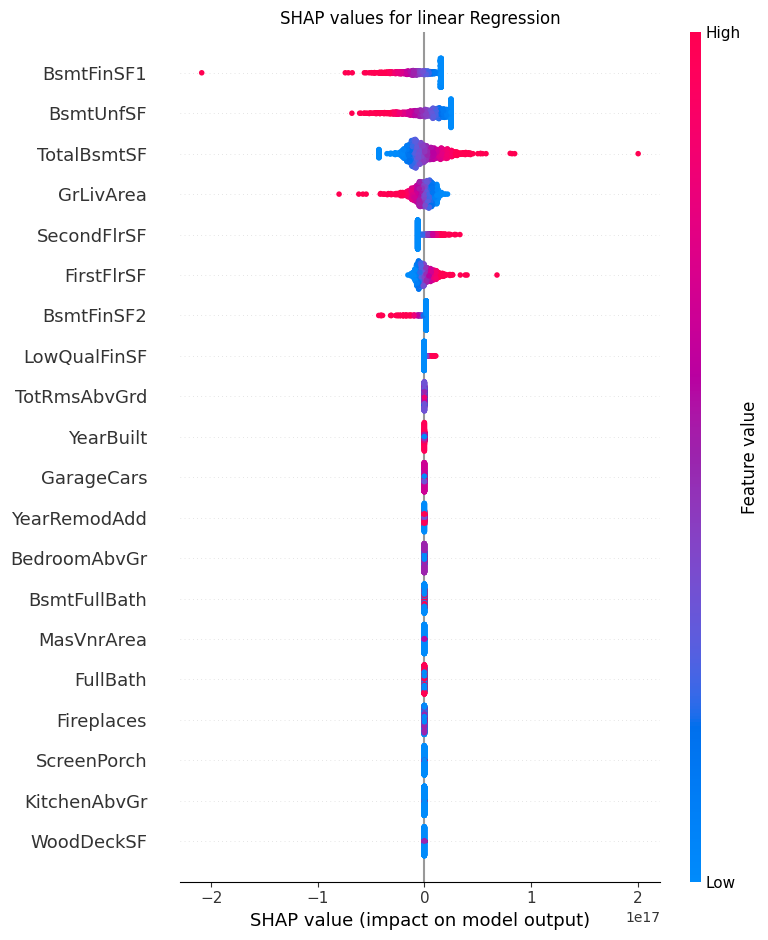

In [ ]:
import shap

# Assuming 'best_model' is your trained LinearRegression model
linear_model = best_model.named_steps['regressor']  # Access the linear regression model from your pipeline
preprocessor = best_model.named_steps['preprocessor']  # Access the preprocessor from your pipeline

# Create a SHAP explainer using the LinearExplainer for your LinearRegression model
explainer = shap.LinearExplainer(linear_model, preprocessor.transform(X_train))

# Calculate SHAP values for the training data
shap_values = explainer(preprocessor.transform(X_train))

# Extract feature names after preprocessing (assuming 'numeric_cols' and 'categorical_cols' are defined)
numeric_cols = X_train.select_dtypes(include=np.number).columns.tolist()
categorical_cols = X_train.select_dtypes(exclude=np.number).columns.tolist()
feature_names = numeric_cols + categorical_cols

# Summary plot of SHAP values
plt.title('SHAP values for linear Regression')
shap.summary_plot(shap_values, preprocessor.transform(X_train), feature_names=feature_names)


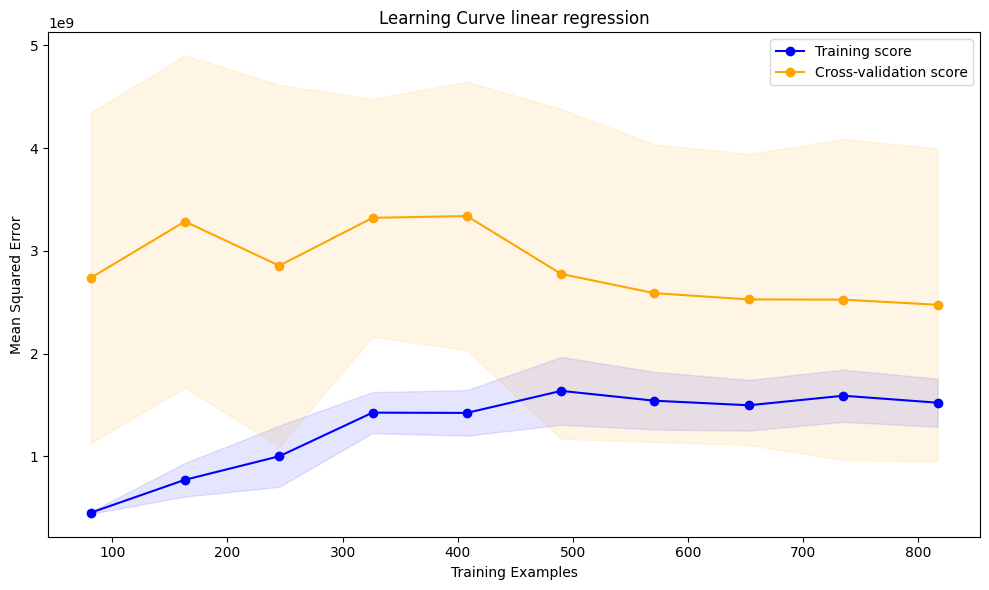

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Define the learning curve function
train_sizes, train_scores, test_scores = learning_curve(
    estimator=best_model,
    X=X_train,
    y=y_train,
    cv=5,
    scoring='neg_mean_squared_error',
    train_sizes=np.linspace(0.1, 1.0, 10),  # Use 10 evenly spaced training set sizes
    n_jobs=-1
)

# Calculate mean and standard deviation of training and test scores
train_mean = -np.mean(train_scores, axis=1)  # Convert negative MSE scores to positive
train_std = np.std(train_scores, axis=1)
test_mean = -np.mean(test_scores, axis=1)    # Convert negative MSE scores to positive
test_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_mean - train_std,
                 train_mean + train_std, alpha=0.1, color="blue")
plt.fill_between(train_sizes, test_mean - test_std,
                 test_mean + test_std, alpha=0.1, color="orange")
plt.plot(train_sizes, train_mean, 'o-', color="blue", label="Training score")
plt.plot(train_sizes, test_mean, 'o-', color="orange", label="Cross-validation score")
plt.xlabel('Training Examples')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve linear regression')
plt.legend(loc="best")
plt.tight_layout()
plt.show()


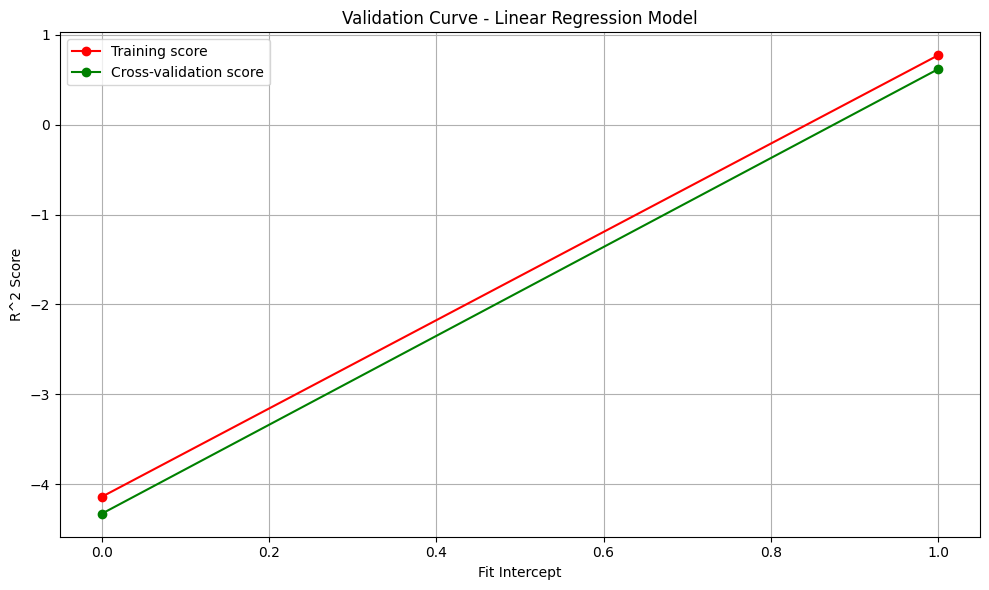

In [ ]:
from sklearn.model_selection import validation_curve
import matplotlib.pyplot as plt
import numpy as np

# Define the range for the parameter (adjust as needed)
# Choose a valid parameter for LinearRegression, such as 'fit_intercept'
param_range = [True, False]

# Calculate validation curve for LinearRegression within the pipeline
train_scores, test_scores = validation_curve(
    best_model,  # Use your 'best_model' here, which includes LinearRegression
    X_train,
    y_train,
    param_name="regressor__fit_intercept",  # Use 'fit_intercept' or another valid parameter
    param_range=param_range,
    cv=5,
    scoring='r2',
    n_jobs=-1
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - Linear Regression Model')
plt.xlabel('Fit Intercept')  # Adjust xlabel based on the hyperparameter being tuned
plt.ylabel('R^2 Score')
# plt.xscale('log') # Remove log scale if not applicable for the chosen parameter
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

# Assuming X_train, X_test, y_train, y_test are already defined and preprocessed

# Identify numeric columns
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

# Create transformers
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Bundle preprocessing for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols)
    ])

# Create a pipeline with preprocessing and model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'regressor__n_estimators': [100, 200, 300, 400, 500],
    'regressor__max_features': ['auto', 'sqrt', 'log2'],
    'regressor__max_depth': [None, 10, 20, 30, 40, 50],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 4],
    'regressor__bootstrap': [True, False]
}

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_grid,
                                   n_iter=20, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLiv...
                                              RandomForestRegressor(random_state=42))]),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'regressor__bootstrap': [True, False],
                                        'regressor__max_depth': [None, 10, 20,
                                                                 30, 40, 50],
                                        'regressor__max_features': ['auto',
                                                                    'sqrt',
                                                                    'log2'],
                                        'regressor__min_samples_leaf': [1, 2,
                                                                        4],
                                        'regressor__min_samples_split': [2, 5,
                                                                         10],
                                        'regressor__n_estimators': [100, 200,
                                                                    300, 400,
                                                                    500]},
                   random_state=42, verbose=2)

In [ ]:
# Get the best model
randomforest = random_search.best_estimator_

# Predict on the training data
y_train_pred = randomforest.predict(X_train)

# Model evaluation on training data
print('Training Data Evaluation:')
print('R^2:', r2_score(y_train, y_train_pred))
print('Adjusted R^2:', 1 - (1 - r2_score(y_train, y_train_pred)) * (len(y_train) - 1) / (len(y_train) - X_train.shape[1] - 1))
print('MAE:', mean_absolute_error(y_train, y_train_pred))
print('MSE:', mean_squared_error(y_train, y_train_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_train, y_train_pred)))

Training Data Evaluation:
R^2: 0.9902697821996844
Adjusted R^2: 0.9894537660571951
MAE: 4367.429852635571
MSE: 65346016.27640721
RMSE: 8083.688284218239


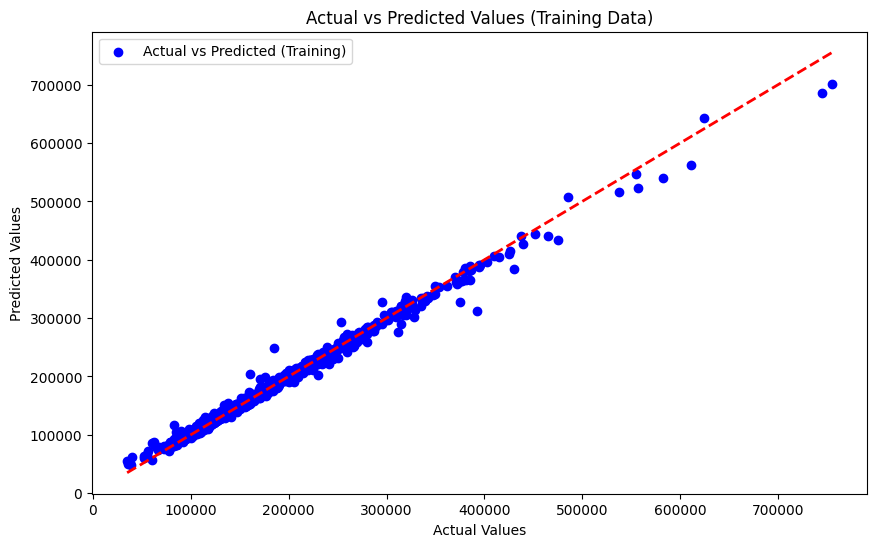

In [ ]:
# Scatter plot of actual vs predicted values for training data
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, color='blue', label='Actual vs Predicted (Training)')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], '--', color='red', linewidth=2)
plt.title('Actual vs Predicted Values (Training Data)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


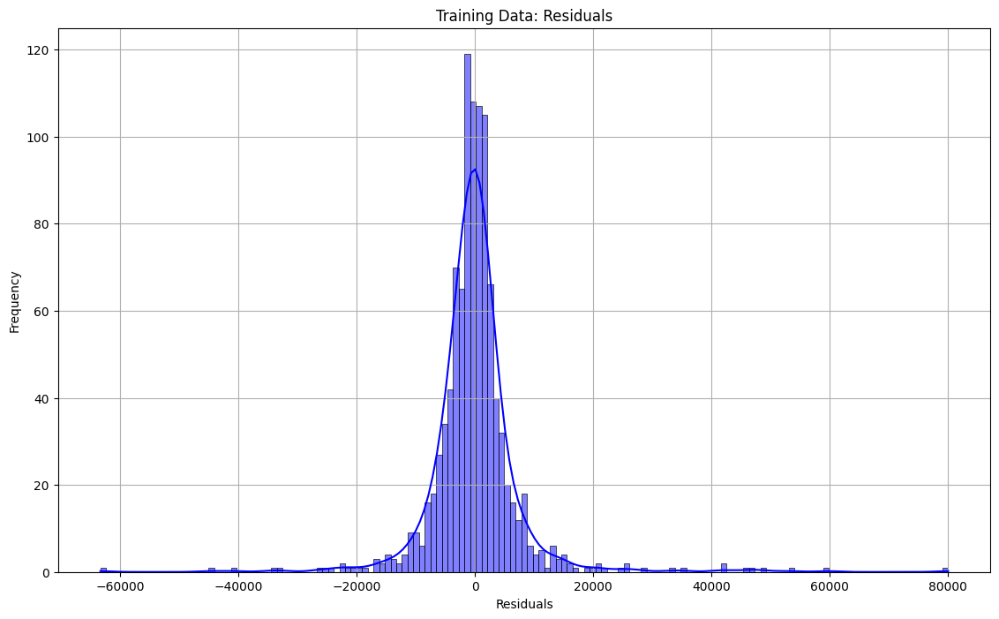

In [ ]:
# Plot residuals for training and test data
plt.figure(figsize=(30, 8))

# Training data residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True, color='blue')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Training Data: Residuals')
plt.grid(True)

In [ ]:
# Get the best model
randomforest = random_search.best_estimator_

# Predict on the test data
y_test_pred = randomforest.predict(X_test)

def evaluate_model_performance(model, X_test, y_test):
    # Calculate R-squared
    acc_rf = r2_score(y_test, y_test_pred) # Remove extra indentation

    # Calculate Adjusted R-squared
    n = len(y_test)
    p = X_test.shape[1]
    adj_r2_rf = 1 - (1 - acc_rf) * (n - 1) / (n - p - 1) # Remove extra indentation

    # Calculate other metrics
    mae_rf = mean_absolute_error(y_test, y_test_pred) # Remove extra indentation
    mse_rf = mean_squared_error(y_test, y_test_pred) # Remove extra indentation
    rmse_rf = np.sqrt(mse_rf) # Remove extra indentation

    # Print the evaluation metrics
    print('R^2:', acc_rf)
    print('Adjusted R^2:', adj_r2_rf)
    print('MAE:', mae_rf)
    print('MSE:', mse_rf)
    print('RMSE:', rmse_rf)

    # Return evaluation metrics
    return acc_rf, adj_r2_rf, mae_rf, mse_rf, rmse_rf # Remove extra indentation

# Evaluate performance on the imputed test data
# Make sure X_test_imputed is defined and imputed before calling this function
acc_rf, adj_r2_rf, mae_rf, mse_rf, rmse_rf = evaluate_model_performance(randomforest, X_test, y_test) # Pass the correct model and test data

# Create a DataFrame to store model names and R-squared scores
models = pd.DataFrame({
    'Model': ['Random Forest'],
    'R-squared Score': [acc_rf * 100]
})

# Display the sorted DataFrame
print(models)

R^2: 0.8573362142641376
Adjusted R^2: 0.8258545408754976
MAE: 18636.997980083463
MSE: 762134216.2563932
RMSE: 27606.778447627552
           Model  R-squared Score
0  Random Forest        85.733621


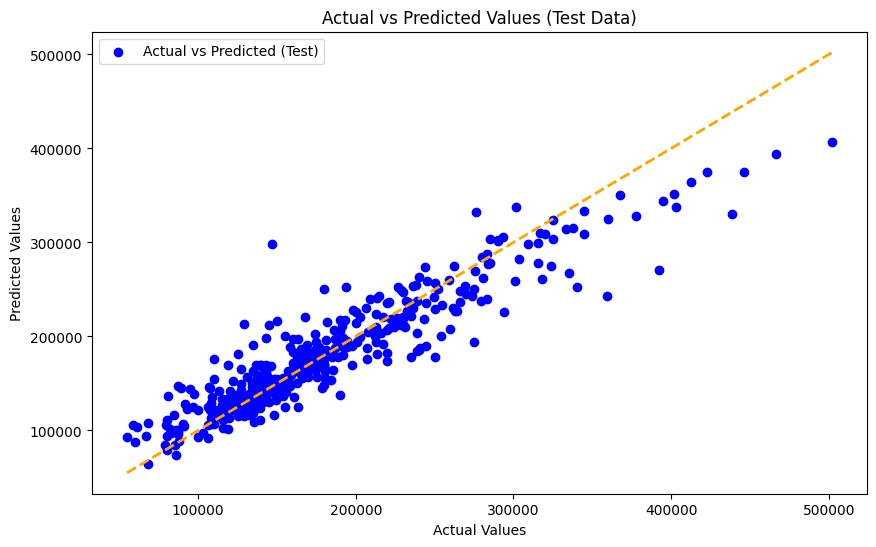

In [ ]:
# Scatter plot of actual vs predicted values for test data
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Actual vs Predicted (Test)')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='orange', linewidth=2)
plt.title('Actual vs Predicted Values (Test Data)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

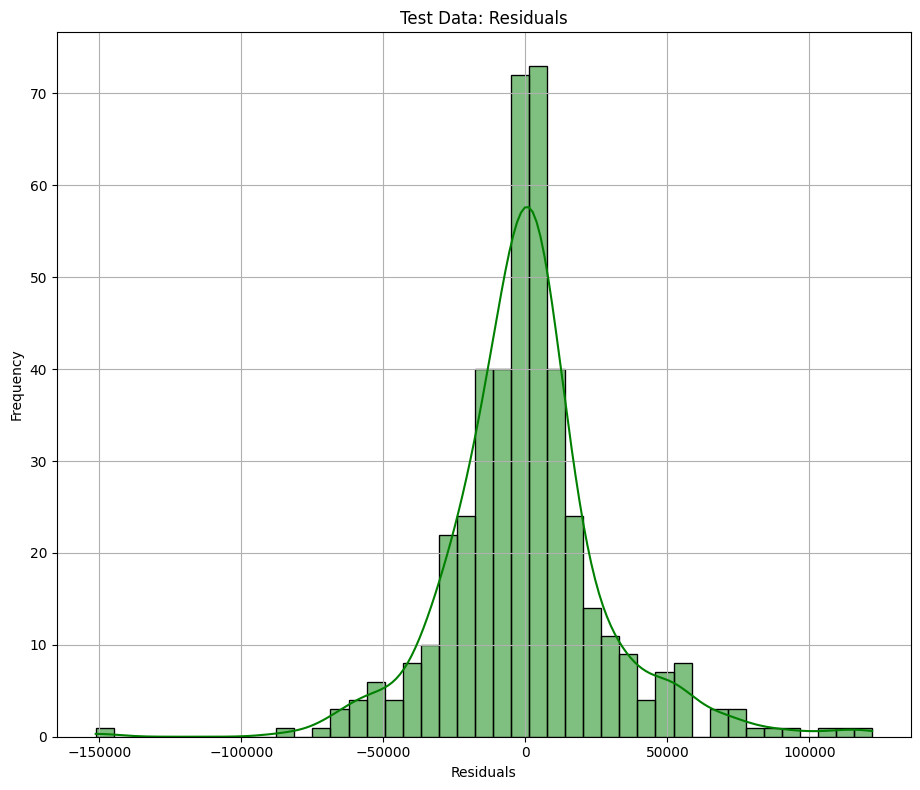

In [ ]:
test_residuals = y_test - y_test_pred
# Test data residuals
plt.figure(figsize=(18, 8))
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True, color='green')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Test Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Perform cross-validation
cv_scores = cross_val_score(randomforest, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print('Cross-validation R-squared scores:', cv_scores)
print('Average R-squared score:', np.mean(cv_scores))
print('Standard deviation of R-squared scores:', np.std(cv_scores))

Cross-validation R-squared scores: [0.84927715 0.62886732 0.88085204 0.82555885 0.89175221]
Average R-squared score: 0.8152615145239576
Standard deviation of R-squared scores: 0.09608208915660775


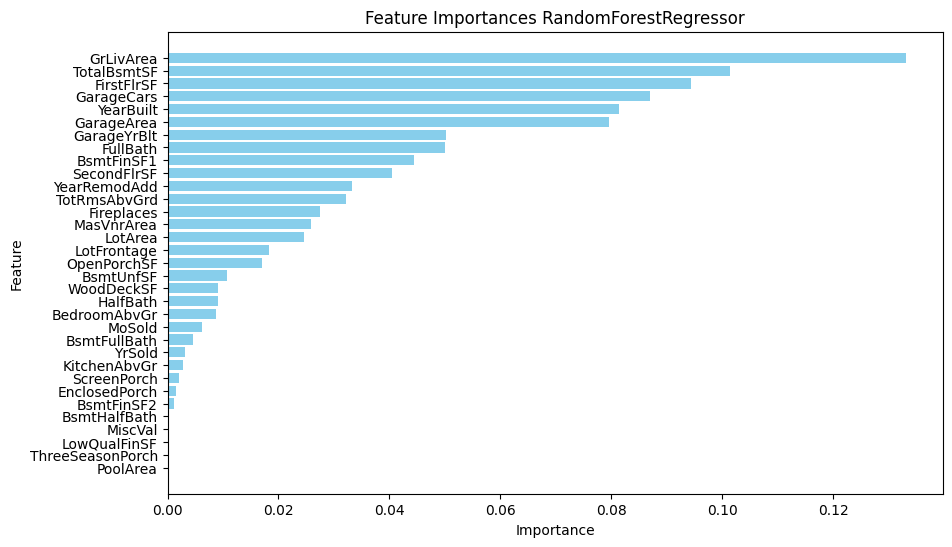

In [ ]:

# Extract feature importances from the best estimator
feature_importances = randomforest.named_steps['regressor'].feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': numeric_cols,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=True)

# Horizontal bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.title('Feature Importances RandomForestRegressor')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


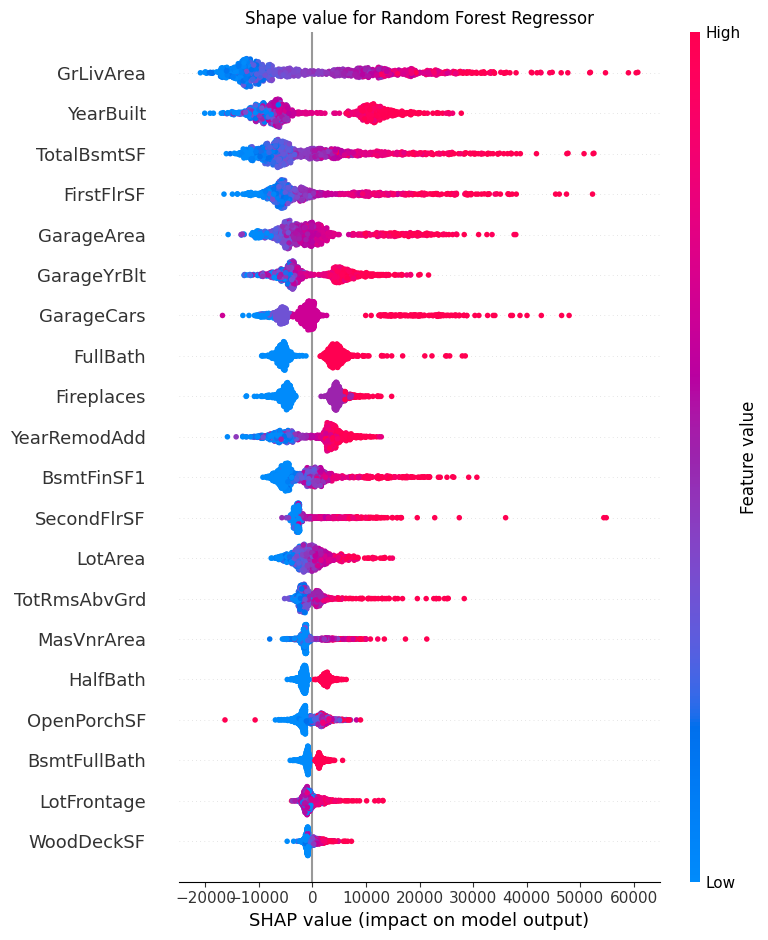

In [ ]:
import shap
import pandas as pd

# Preprocess the training data
X_train_preprocessed = randomforest.named_steps['preprocessor'].transform(X_train)

# Convert preprocessed data to DataFrame for SHAP summary plot compatibility
X_train_preprocessed_df = pd.DataFrame(X_train_preprocessed, columns=numeric_cols)

# Create a SHAP explainer object using the preprocessed training data
explainer = shap.TreeExplainer(randomforest.named_steps['regressor'])
shap_values = explainer.shap_values(X_train_preprocessed_df)

# Plot SHAP summary plot
plt.title('Shape value for Random Forest Regressor')
shap.summary_plot(shap_values, X_train_preprocessed_df)


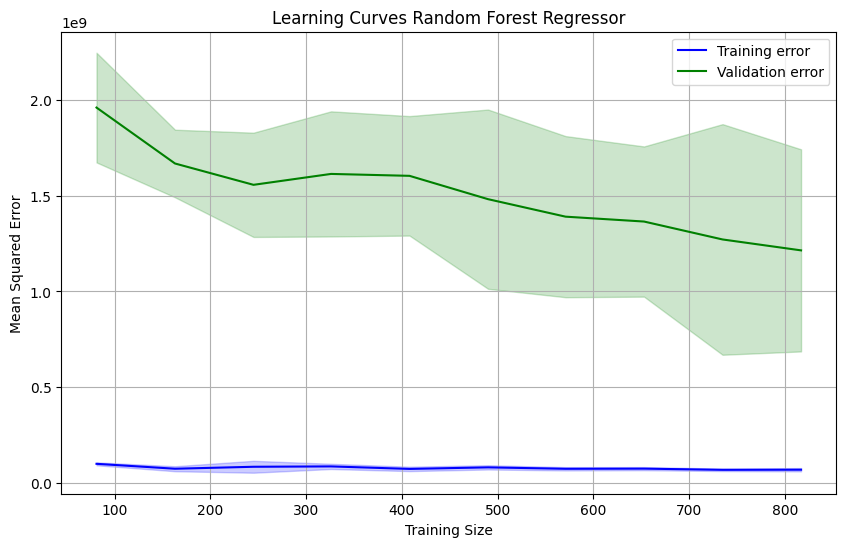

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    randomforest, X_train, y_train, cv=5, scoring='neg_mean_squared_error', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
test_scores_mean = -test_scores.mean(axis=1)
test_scores_std = test_scores.std(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error', color='blue')
plt.plot(train_sizes, test_scores_mean, label='Validation error', color='green')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, color='green', alpha=0.2)
plt.title('Learning Curves Random Forest Regressor')
plt.xlabel('Training Size')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid()
plt.show()

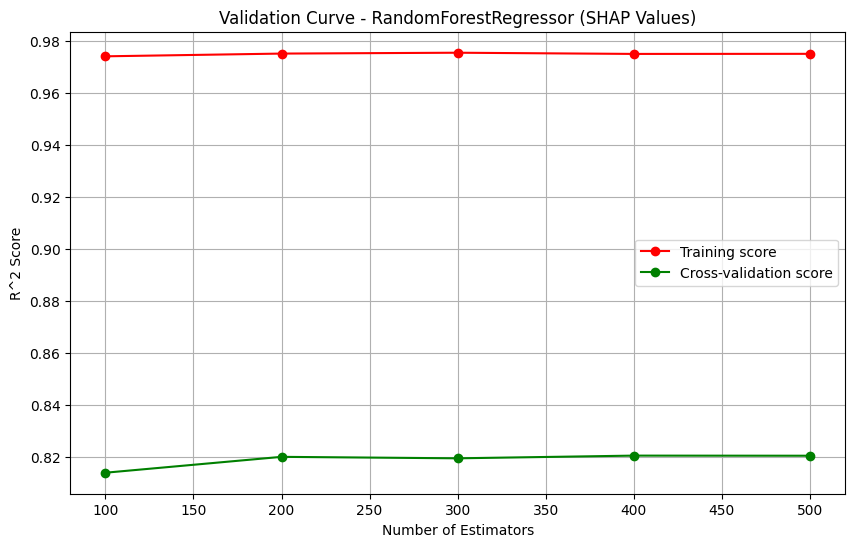

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shap
import pandas as pd
from sklearn.model_selection import validation_curve
from sklearn.ensemble import RandomForestRegressor

# Assuming X_train and y_train are already defined and preprocessed

# Preprocess the training data
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns
X_train_preprocessed = randomforest.named_steps['preprocessor'].transform(X_train)
X_train_preprocessed_df = pd.DataFrame(X_train_preprocessed, columns=numeric_cols)

# Create a SHAP explainer object using the preprocessed training data
explainer = shap.TreeExplainer(randomforest.named_steps['regressor'])
shap_values = explainer.shap_values(X_train_preprocessed_df)

# Calculate SHAP values mean for each sample (not for each feature)
shap_values_mean = np.abs(shap_values).mean(axis=1) # Changed axis to 1

# Define the range for number of trees (n_estimators)
param_range = [100, 200, 300, 400, 500]

# Calculate validation curve using SHAP values mean
train_scores, test_scores = validation_curve(
    RandomForestRegressor(random_state=42), X_train_preprocessed_df, shap_values_mean,
    param_name="n_estimators", param_range=param_range,
    cv=5, scoring='r2', n_jobs=-1
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - RandomForestRegressor (SHAP Values)')
plt.xlabel('Number of Estimators')
plt.ylabel('R^2 Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# Identify numeric columns
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

# Create imputer for numeric columns
imputer = SimpleImputer(strategy='mean')

# Fit and transform imputer on training data, transform test data
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train[numeric_cols]), columns=numeric_cols)
X_test_imputed = pd.DataFrame(imputer.transform(X_test[numeric_cols]), columns=numeric_cols)
# Create transformer for numeric data
numeric_transformer = Pipeline(steps=[
    ('imputer', imputer),
    ('scaler', StandardScaler())
])

# Bundle preprocessing for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols)
    ])

# Create XGBRegressor pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(random_state=42))
])

# Define parameter grid for RandomizedSearchCV
param_grid = {
    'regressor__n_estimators': [100, 200, 300],
    'regressor__learning_rate': [0.01, 0.1, 0.2],
    'regressor__max_depth': [3, 4, 5, 6, 7],
    'regressor__min_child_weight': [1, 3, 5],
    'regressor__subsample': [0.6, 0.8, 1.0],
    'regressor__colsample_bytree': [0.6, 0.8, 1.0],
    'regressor__gamma': [0, 0.1, 0.2]
}

# Create RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_grid,
                                   n_iter=20, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit RandomizedSearchCV model
random_search.fit(X_train, y_train)


Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLiv...
                                                           random_state=42, ...))]),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'regressor__colsample_bytree': [0.6,
                                                                        0.8,
                                                                        1.0],
                                        'regressor__gamma': [0, 0.1, 0.2],
                                        'regressor__learning_rate': [0.01, 0.1,
                                                                     0.2],
                                        'regressor__max_depth': [3, 4, 5, 6, 7],
                                        'regressor__min_child_weight': [1, 3,
                                                                        5],
                                        'regressor__n_estimators': [100, 200,
                                                                    300],
                                        'regressor__subsample': [0.6, 0.8,
                                                                 1.0]},
                   random_state=42, verbose=2)

In [ ]:
# Retrieve best model from RandomizedSearchCV
XGB = random_search.best_estimator_

# Predict using the training set
y_train_pred = XGB.predict(X_train_imputed)  # Use the fitted pipeline for prediction

# Evaluate the model on the training set
r2_train = r2_score(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Calculate adjusted R-squared
n_train = X_train_imputed.shape[0]  # Number of training samples
p_train = X_train_imputed.shape[1]  # Number of predictors
adj_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Print training set evaluation metrics
print("Training Set Evaluation:")
print(f"R2 Score: {r2_train:.4f}")
print(f"Adjusted R2 Score: {adj_r2_train:.4f}")
print(f"Mean Absolute Error: {mae_train:.4f}")
print(f"Mean Squared Error: {mse_train:.4f}")
print(f"Root Mean Squared Error: {rmse_train:.4f}")

Training Set Evaluation:
R2 Score: 0.9999
Adjusted R2 Score: 0.9999
Mean Absolute Error: 553.9067
Mean Squared Error: 543796.2913
Root Mean Squared Error: 737.4254


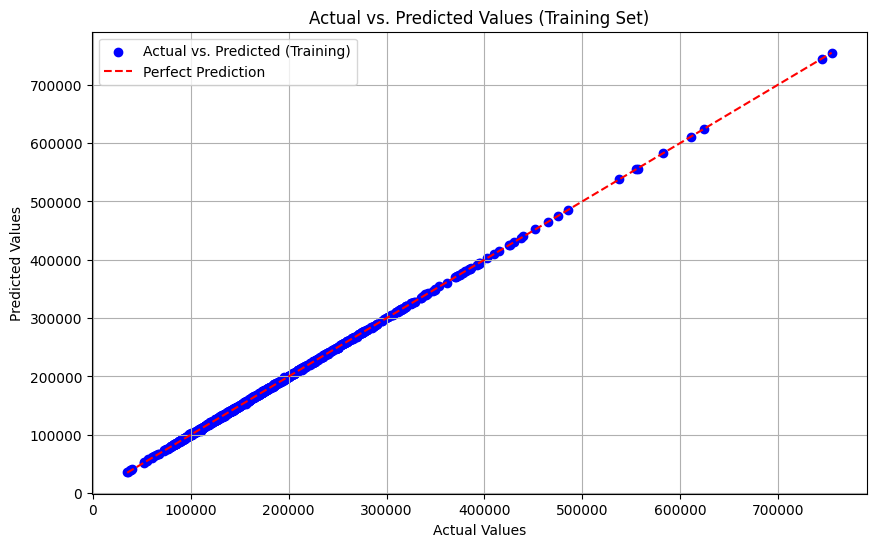

In [ ]:
# Plot actual vs. predicted values for training set
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, color='blue', label='Actual vs. Predicted (Training)')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='red', label='Perfect Prediction')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Training Set)')
plt.legend()
plt.grid(True)
plt.show()


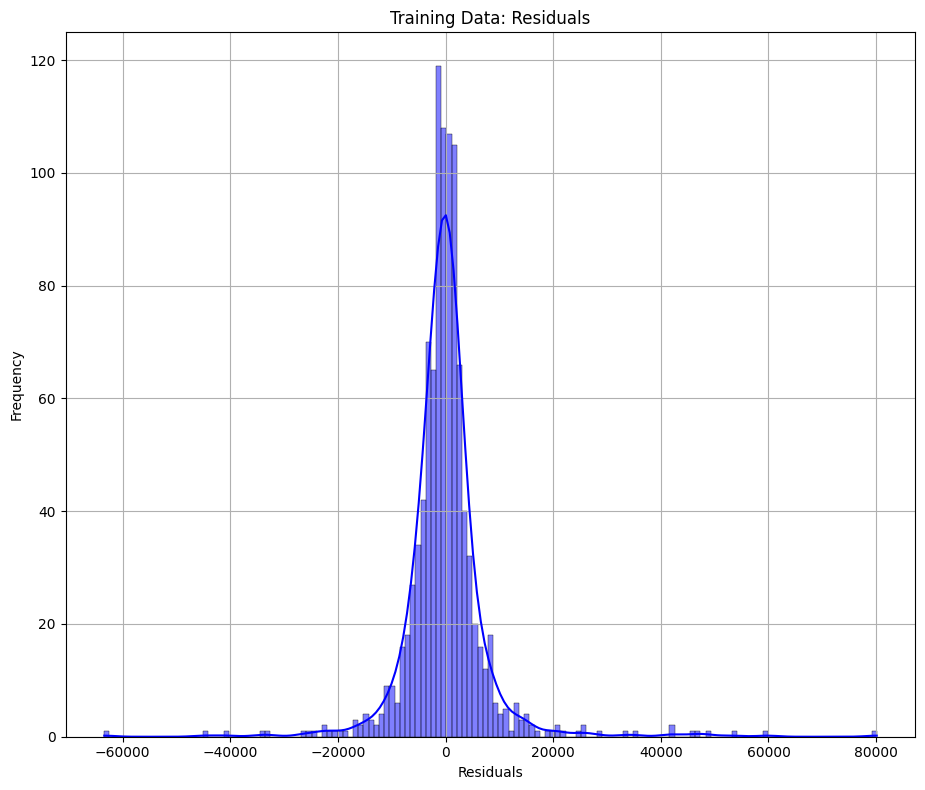

In [ ]:
plt.figure(figsize=(18, 8))

# Training data residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True, color='blue')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Training Data: Residuals')
plt.grid(True)
plt.tight_layout()
plt.show()



In [ ]:
# Function to evaluate model performance
def evaluate_model_performance(XGB, X_test, y_test):
    # Predict using the model
    y_test_pred = XGB.predict(X_test)

    # Calculate R-squared
    acc_xgb = r2_score(y_test, y_test_pred)

    # Calculate Adjusted R-squared
    n = len(y_test)
    p = X_test.shape[1]
    adj_r2_xgb = 1 - (1 - acc_xgb) * (n - 1) / (n - p - 1)

    # Calculate other metrics
    mae_xgb = mean_absolute_error(y_test, y_test_pred)
    mse_xgb = mean_squared_error(y_test, y_test_pred)
    rmse_xgb = np.sqrt(mse_xgb)

    # Print the evaluation metrics
    print('XGBRegressor Evaluation:')
    print('R^2:', acc_xgb)
    print('Adjusted R^2:', adj_r2_xgb)
    print('MAE:', mae_xgb)
    print('MSE:', mse_xgb)
    print('RMSE:', rmse_xgb)

    # Return evaluation metrics
    return acc_xgb, adj_r2_xgb, mae_xgb, mse_xgb, rmse_xgb

# Evaluate performance on the imputed test data using the best model
acc_xgb, adj_r2_xgb, mae_xgb, mse_xgb, rmse_xgb = evaluate_model_performance(best_model, X_test_imputed, y_test)


XGBRegressor Evaluation:
R^2: 0.8052583214401906
Adjusted R^2: 0.7893512041320874
MAE: 23669.781806913863
MSE: 1040343180.2688072
RMSE: 32254.351338521865


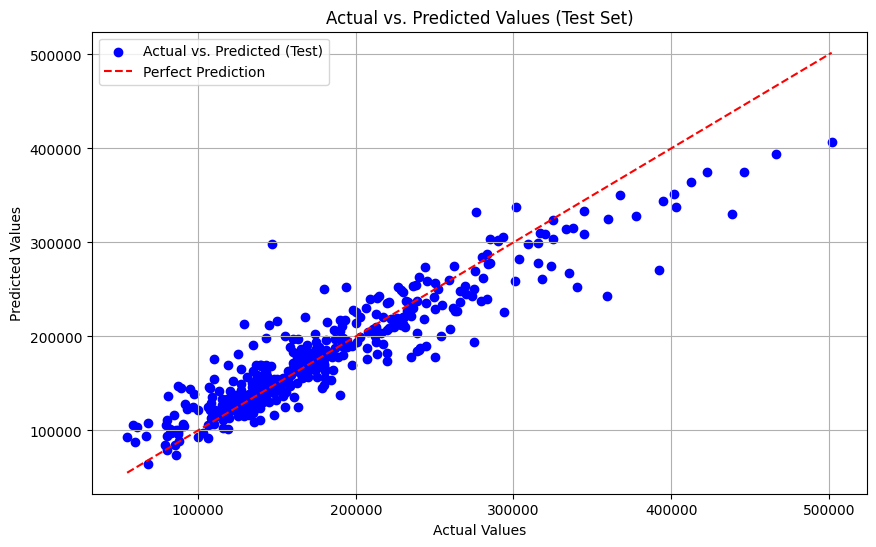

In [ ]:
# Plot actual vs. predicted values for test set
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Actual vs. Predicted (Test)')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', label='Perfect Prediction')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

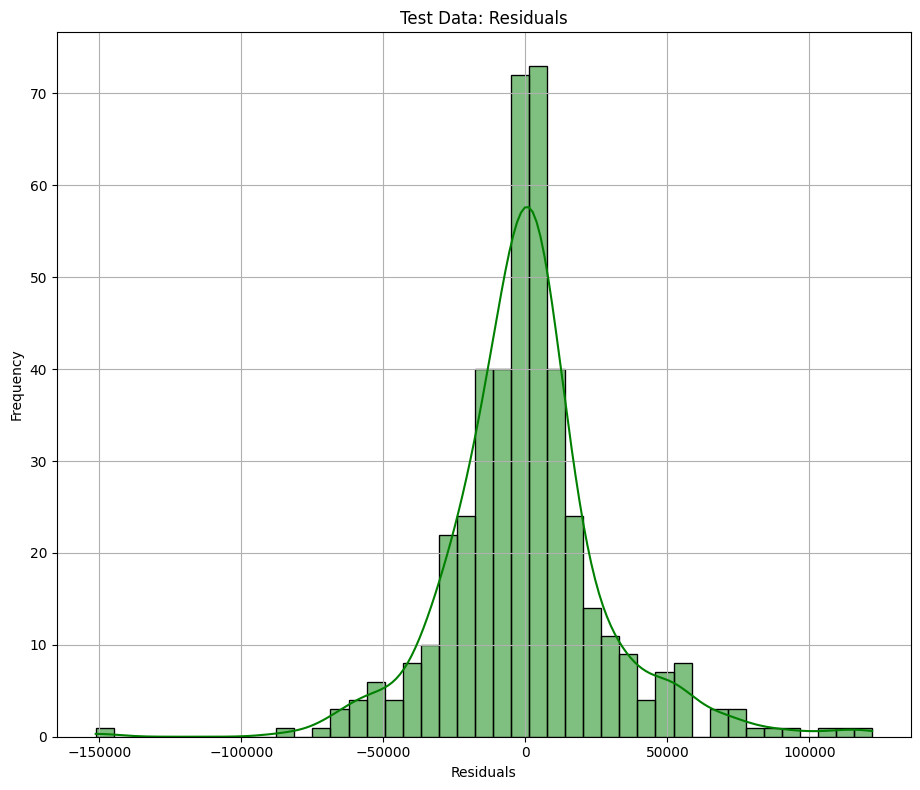

In [ ]:
plt.figure(figsize=(18, 8))
# Test data residuals
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True, color='green')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Test Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Perform cross-validation
cv_scores = cross_val_score(XGB, X_train_imputed, y_train, cv=5, scoring='r2')

# Calculate average R-squared score and standard deviation of R-squared scores
avg_r2_cv = np.mean(cv_scores)
std_r2_cv = np.std(cv_scores)

# Print cross-validation results
print('Cross-validation R-squared scores:', cv_scores)
print('Average R-squared score (CV):', avg_r2_cv)
print('Standard deviation of R-squared scores (CV):', std_r2_cv)



Cross-validation R-squared scores: [0.82975187 0.59166145 0.8608747  0.82452076 0.90904294]
Average R-squared score (CV): 0.8031703437289694
Standard deviation of R-squared scores (CV): 0.10994292269162455


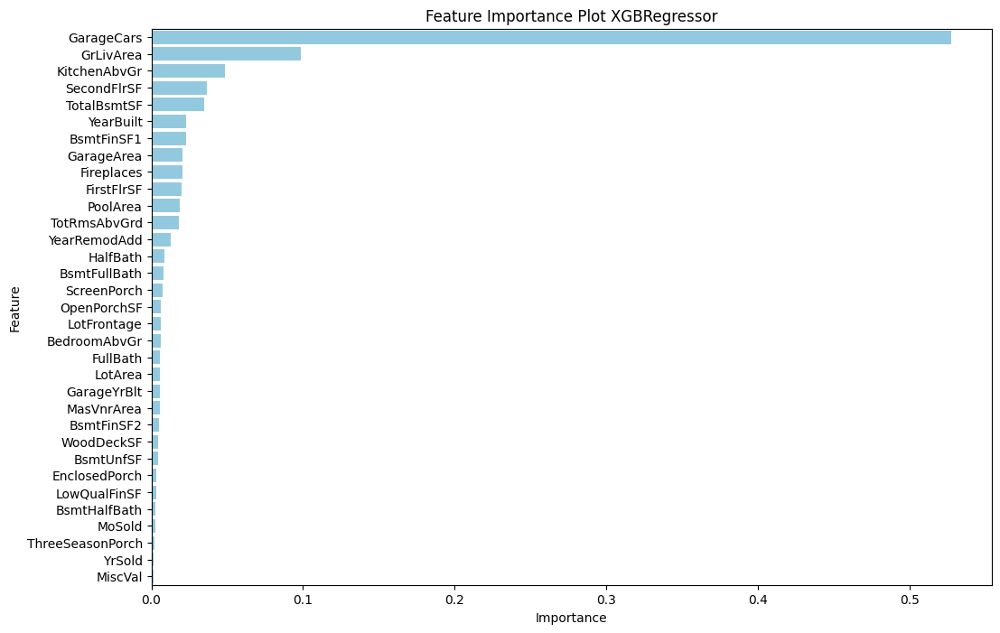

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the trained XGBRegressor from the pipeline
best_xgb = XGB.named_steps['regressor']

# Get feature importances directly from the XGBRegressor model
feature_importance = best_xgb.feature_importances_

# Create a DataFrame to store feature importances with corresponding column names
feature_importance_df = pd.DataFrame({'Feature': numeric_cols, 'Importance': feature_importance})

# Sort features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Plotting feature importances using barh (horizontal bar plot)
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance Plot XGBRegressor')
plt.show()

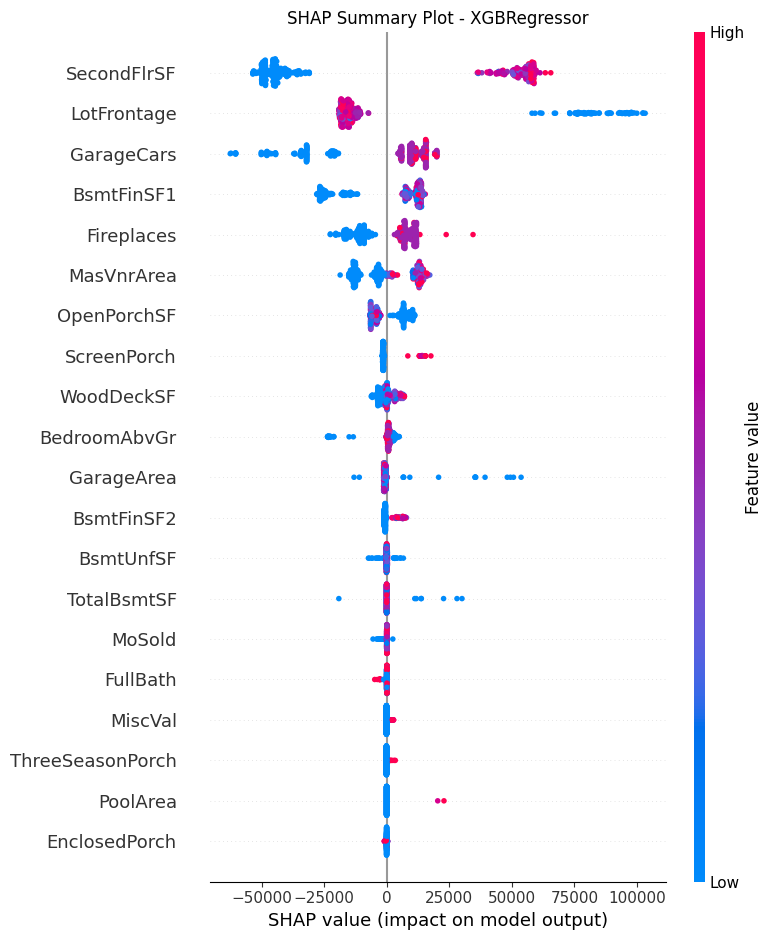

In [78]:
import shap

# Extract the trained XGBRegressor from the pipeline
best_xgb = XGB.named_steps['regressor']

# Create an explainer object directly with the XGBRegressor model
explainer = shap.Explainer(best_xgb, X_test_imputed)

# Calculate SHAP values
shap_values = explainer(X_test_imputed)

# Plot SHAP summary plot
plt.figure(figsize=(12, 8))
plt.title('SHAP Summary Plot - XGBRegressor')
shap.summary_plot(shap_values, X_test_imputed)
plt.show()

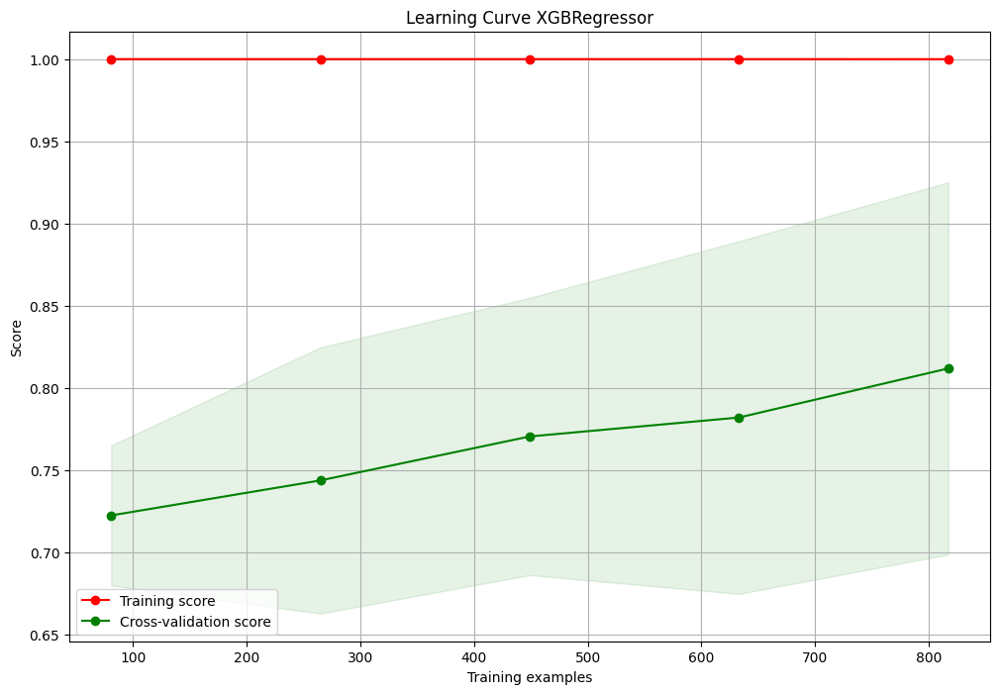

In [79]:
from sklearn.model_selection import learning_curve

# Define function to plot learning curves
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize=(12, 8))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Plot learning curve
plot_learning_curve(XGB, "Learning Curve XGBRegressor", X_train_imputed, y_train, cv=5)
plt.show()


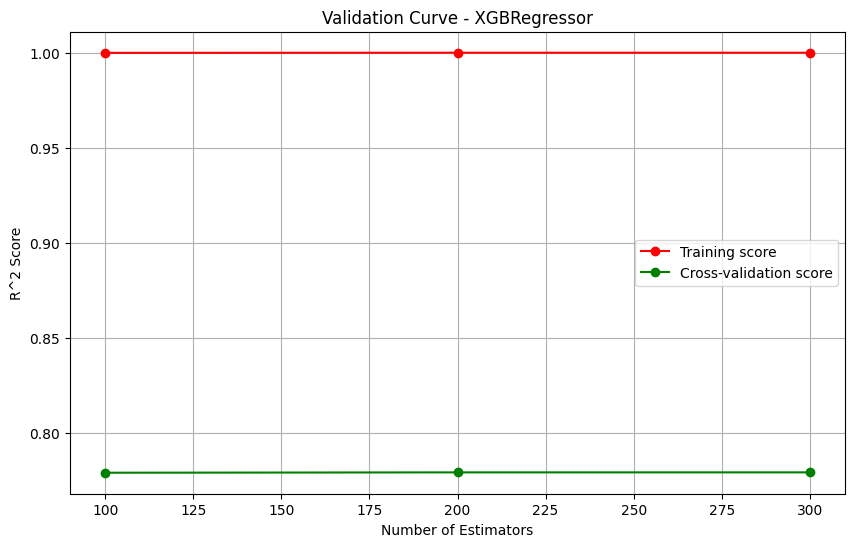

In [ ]:
from sklearn.model_selection import validation_curve

# Define parameter range for validation curve
param_range = [100, 200, 300]

# Calculate validation curve
train_scores, test_scores = validation_curve(
    XGBRegressor(random_state=42), X_train_imputed, y_train,
    param_name='n_estimators', param_range=param_range,
    cv=5, scoring='r2', n_jobs=-1
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.plot(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - XGBRegressor')
plt.xlabel('Number of Estimators')
plt.ylabel('R^2 Score')
plt.legend(loc='best')
plt.grid()
plt.show()


In [80]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from scipy.stats import uniform, randint

# Identify numerical and categorical columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Create transformers for numerical and categorical features
numerical_transformer = SimpleImputer(strategy='mean')
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a pipeline that includes preprocessing and scaling
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# Define the parameter distribution for RandomizedSearchCV, including parameters for SVR
param_dist = {
    'svr__kernel': ['linear', 'rbf', 'poly'],
    'svr__C': uniform(100, 900),  # uniform distribution from 100 to 1000
    'svr__epsilon': uniform(0.1, 9.9),  # uniform distribution from 0.1 to 10
    'svr__gamma': ['scale', 'auto', 0.1, 0.5, 1]
}

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='r2', n_jobs=-1, random_state=42)

# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               SimpleImputer(),
                                                                               Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'FirstFlrSF',
       'SecondFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath',...
                                             ('scaler', StandardScaler()),
                                             ('svr', SVR())]),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'svr__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7ee7ba63f460>,
                                        'svr__epsilon': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7ee7cc585240>,
                                        'svr__gamma': ['scale', 'auto', 0.1,
                                                       0.5, 1],
                                        'svr__kernel': ['linear', 'rbf',
                                                        'poly']},
                   random_state=42, scoring='r2')

In [81]:
# Extract the preprocessed data from the pipeline
X_train_preprocessed = random_search.best_estimator_.named_steps['preprocessor'].transform(X_train)

# Scale the preprocessed data
X_train_scaled_full = random_search.best_estimator_.named_steps['scaler'].transform(X_train_preprocessed)

# Retrain the best SVR model on the fully preprocessed and scaled training data
best_svr = random_search.best_estimator_.named_steps['svr']
best_svr.fit(X_train_scaled_full, y_train)

# Model Evaluation on training data
y_train_pred = best_svr.predict(X_train_scaled_full)
print('Training Data Evaluation:')
print('R^2:', r2_score(y_train, y_train_pred))
print('Adjusted R^2:', 1 - (1 - r2_score(y_train, y_train_pred)) * (len(y_train) - 1) / (len(y_train) - X_train_scaled_full.shape[1] - 1))
print('MAE:', mean_absolute_error(y_train, y_train_pred))
print('MSE:', mean_squared_error(y_train, y_train_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_train, y_train_pred)))



Training Data Evaluation:
R^2: 0.752628641958449
Adjusted R^2: 0.7284234875694371
MAE: 20686.29126417493
MSE: 1661291979.3404748
RMSE: 40758.94968397094


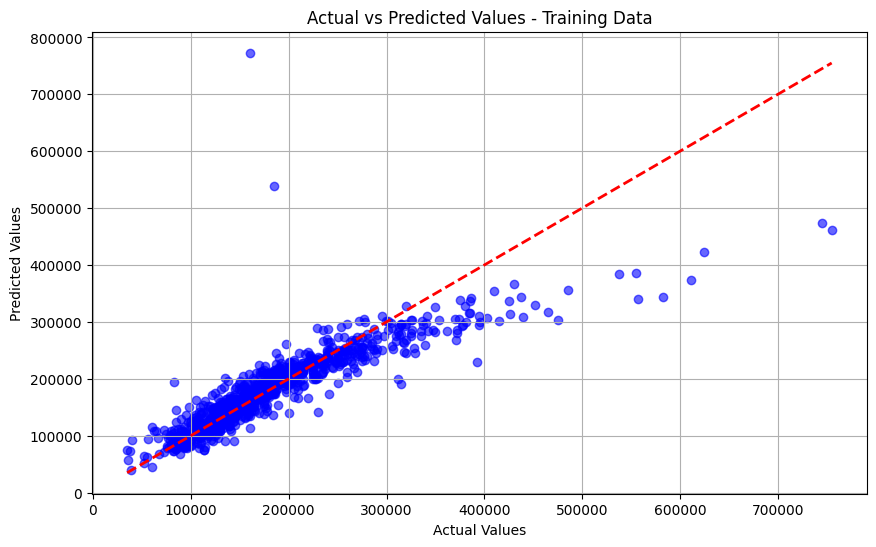

In [ ]:
# Actual vs Predicted plot
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_train_pred, color='blue', alpha=0.6)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='red', linewidth=2, linestyle='--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values - Training Data')
plt.grid(True)
plt.show()

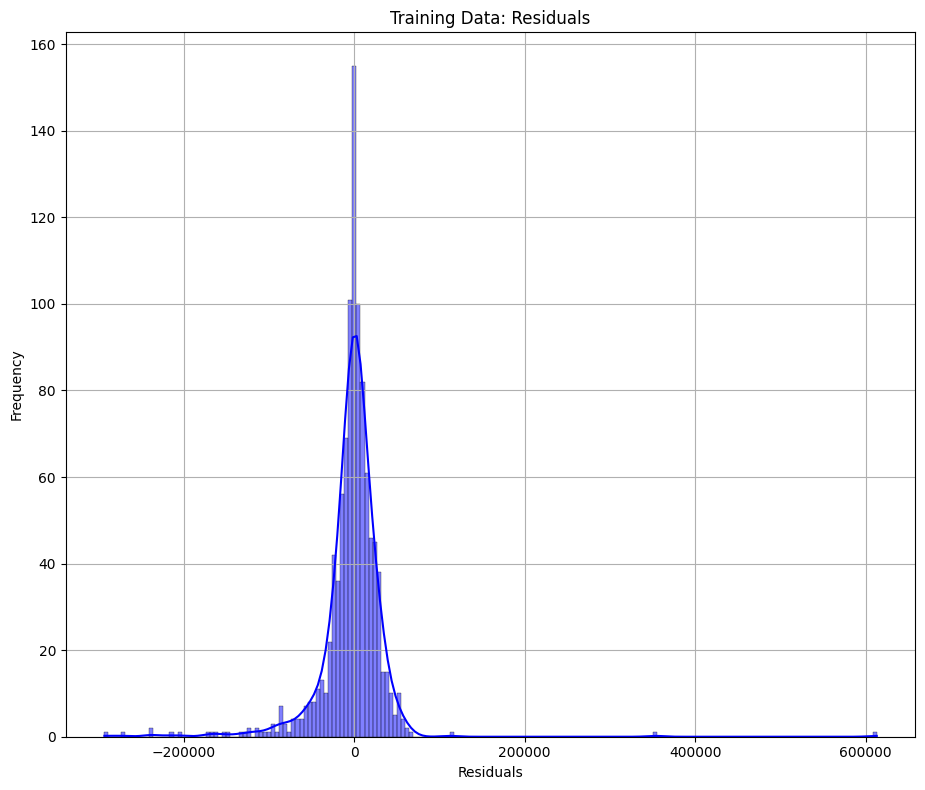

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming train_residuals are computed as:
train_residuals = y_train_pred - y_train

# Plotting residuals for training data
plt.figure(figsize=(18, 8))

# Training data residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True, color='blue')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Training Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()


In [82]:

# Preprocess the test data using the same preprocessor from the pipeline
X_test_preprocessed = random_search.best_estimator_.named_steps['preprocessor'].transform(X_test)

# Scale the preprocessed test data using the same scaler from the pipeline
X_test_scaled = random_search.best_estimator_.named_steps['scaler'].transform(X_test_preprocessed)

# Predict using the preprocessed and scaled test data
y_test_pred = best_svr.predict(X_test_scaled)

# Calculate evaluation metrics
acc_svm = r2_score(y_test, y_test_pred)
adj_r2_svm = 1 - (1 - acc_svm) * (len(y_test) - 1) / (len(y_test) - X_test_scaled.shape[1] - 1)
mae_svm = mean_absolute_error(y_test, y_test_pred)
mse_svm = mean_squared_error(y_test, y_test_pred)
rmse_svm = np.sqrt(mse_svm)

# Print the evaluation metrics
print('Test Data Evaluation:')
print('R^2:', acc_svm)
print('Adjusted R^2:', adj_r2_svm)
print('MAE:', mae_svm)
print('MSE:', mse_svm)
print('RMSE:', rmse_svm)

Test Data Evaluation:
R^2: 0.8245191544346544
Adjusted R^2: 0.7783666777108207
MAE: 21466.557213961758
MSE: 937448533.3690023
RMSE: 30617.781326689925


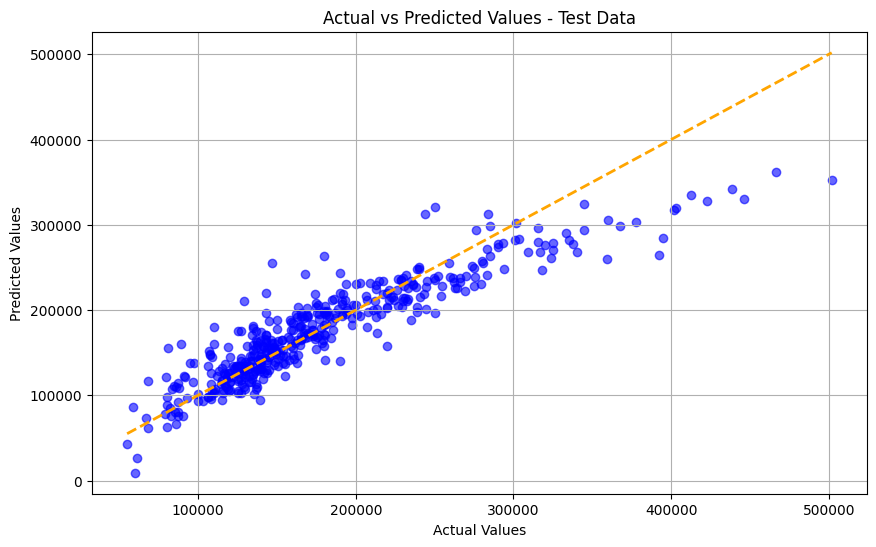

In [ ]:
# Actual vs Predicted plot for test data
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', alpha=0.6)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='orange', linewidth=2, linestyle='--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values - Test Data')
plt.grid(True)
plt.show()

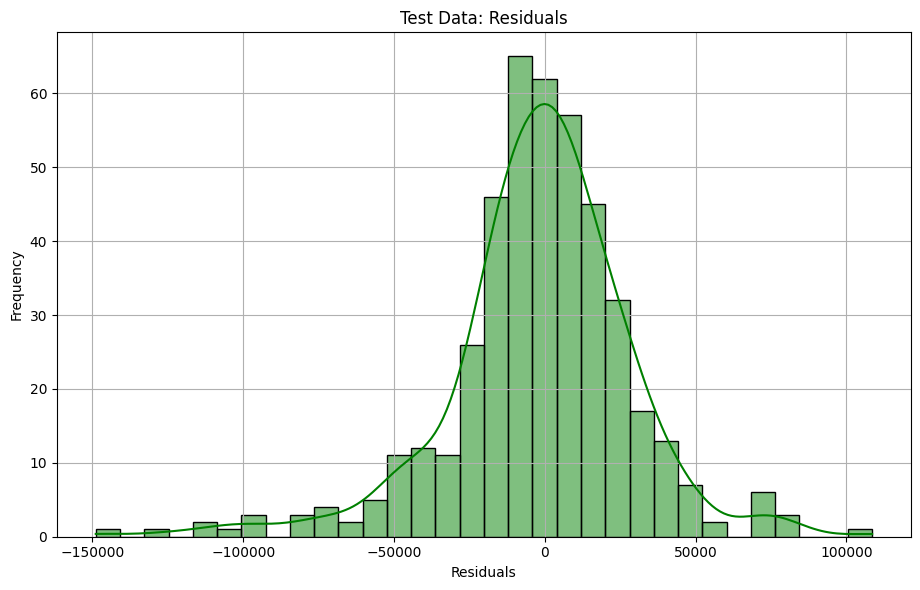

In [ ]:
# Test data residuals

test_residuals = y_test_pred - y_test
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True, color='green')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Test Data: Residuals')
plt.grid(True)

plt.tight_layout()
plt.show()

In [85]:
# Cross-validation scores
cv_scores = cross_val_score(random_search.best_estimator_, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("SVR:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")

SVR:
  Cross-validation R-squared scores: [0.8329802  0.38625452 0.77591688 0.7982918  0.80456368]
  Average R-squared score: 0.7196
  Standard deviation of R-squared scores: 0.1677


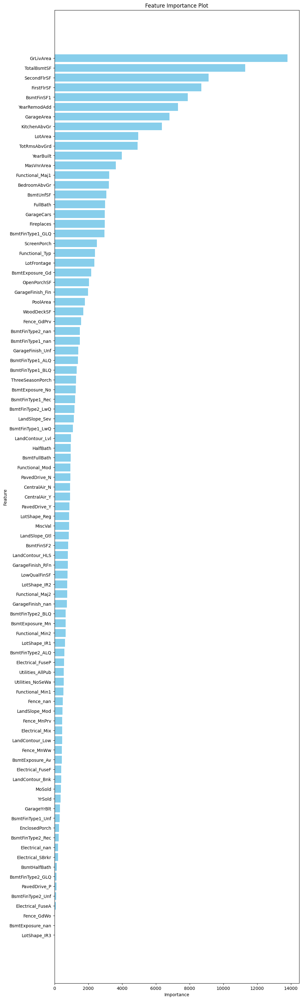

In [86]:
import matplotlib.pyplot as plt
import numpy as np

# Get the SVR model from the best estimator pipeline
svr_model = random_search.best_estimator_.named_steps['svr']

# Check if the model is indeed an SVR
if isinstance(svr_model, SVR):
    # Get feature importances (coefficients) from the SVR model
    coef = svr_model.coef_.flatten()
    feature_names = numerical_cols.tolist() + \
                    list(random_search.best_estimator_.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out())

    features_df = pd.DataFrame({'Feature': feature_names, 'Importance': np.abs(coef)})
    features_df = features_df.sort_values(by='Importance', ascending=False)

    # Plot feature importances
    plt.figure(figsize=(10, 40))
    plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importance Plot')
    plt.gca().invert_yaxis()
    plt.show()
else:
    print("Feature importances are not available for this model.")

Feature Importance Plot for SVR
SVR does not provide built-in feature importances. However, we can calculate feature importances using permutation importance from sklearn.

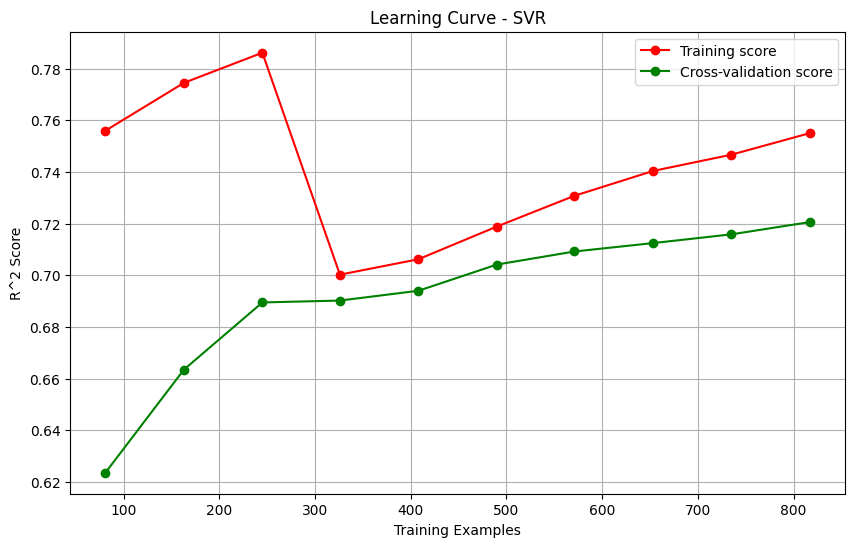

In [87]:
from sklearn.model_selection import learning_curve

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    best_svr, X_train_scaled_full, y_train, cv=5, n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='r2'
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Learning Curve - SVR')
plt.xlabel('Training Examples')
plt.ylabel('R^2 Score')
plt.legend(loc='best')
plt.grid()
plt.show()


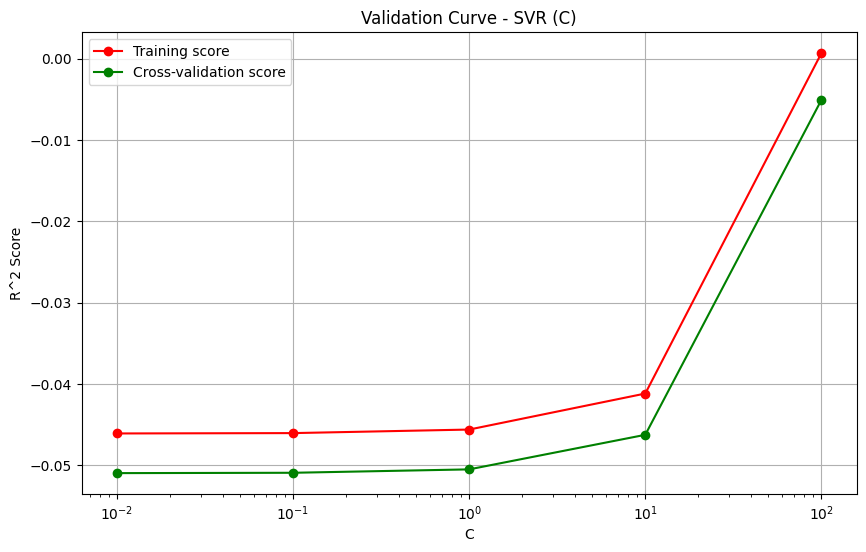

In [88]:
# Define parameter range for validation curve
param_range = np.logspace(-2, 2, 5)

# Calculate validation curve for 'C'
train_scores, test_scores = validation_curve(
    pipeline, X_train, y_train,
    param_name='svr__C', param_range=param_range,
    cv=5, scoring='r2', n_jobs=1
)

# Calculate mean scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

# Plot validation curve
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_scores_mean, 'o-', color='r', label='Training score')
plt.semilogx(param_range, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Validation Curve - SVR (C)')
plt.xlabel('C')
plt.ylabel('R^2 Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [93]:


# Cross-validation scores
cv_scores = cross_val_score(ridge, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("Ridge:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")



# Cross-validation scores
cv_scores = cross_val_score(GradientBoosting, X_train, y_train, cv=5, scoring='r2')
# Calculate average R-squared score and standard deviation of R-squared scores
avg_r2_cv = np.mean(cv_scores)
std_r2_cv = np.std(cv_scores)

# Print cross-validation results
print("Gradient Boosting:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")


# Cross-validation scores
cv_scores = cross_val_score(lasso, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("Lasso")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")

# Cross-validation scores
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')

print("MLP Regressor")
# Print cross-validation results

print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")



# Cross-validation scores
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("Linear Regression::")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")


# Cross-validation scores
cv_scores = cross_val_score(randomforest, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("Random Forest:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")


# Cross-validation scores
cv_scores = cross_val_score(XGB, X_train_imputed, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("XGBoost:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")

# Cross-validation scores
cv_scores = cross_val_score(random_search.best_estimator_, X_train, y_train, cv=5, scoring='r2')

# Print cross-validation results
print("SVR:")
print(f"  Cross-validation R-squared scores: {cv_scores}")
print(f"  Average R-squared score: {cv_scores.mean():.4f}")
print(f"  Standard deviation of R-squared scores: {cv_scores.std():.4f}")

Ridge:
  Cross-validation R-squared scores: [0.83119602 0.42214477 0.82191105 0.72229155 0.81047251]
  Average R-squared score: 0.7216
  Standard deviation of R-squared scores: 0.1547
Gradient Boosting:
  Cross-validation R-squared scores: [0.87250718 0.57620382 0.88851195 0.85277602 0.91001072]
  Average R-squared score: 0.8200
  Standard deviation of R-squared scores: 0.1233
Lasso
  Cross-validation R-squared scores: [0.86282406 0.32865897 0.90764447 0.68405715 0.90077864]
  Average R-squared score: 0.7368
  Standard deviation of R-squared scores: 0.2197
MLP Regressor
  Cross-validation R-squared scores: [-0.03802294 -0.08836585 -0.08083114 -0.02769667 -0.01753062]
  Average R-squared score: -0.0505
  Standard deviation of R-squared scores: 0.0287
Linear Regression::
  Cross-validation R-squared scores: [0.80250458 0.11242798 0.79247263 0.59830633 0.78716177]
  Average R-squared score: 0.6186
  Standard deviation of R-squared scores: 0.2642
Random Forest:
  Cross-validation R-squared

In [94]:
# Define models
models = {
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=0.1),
    'Gradient Boosting': GradientBoostingRegressor(),
    'MLP Regressor': MLPRegressor(),
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'XGBoost': XGBRegressor(),
    'SVR': SVR()
}

# Perform cross-validation for each model
results = {}
for model_name, model in models.items():
    # Create a pipeline that includes preprocessing and the model
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    # Perform cross-validation
    cv = KFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='r2')
    results[model_name] = scores

# Print cross-validation results
for model_name, scores in results.items():
    print(f"{model_name}:")
    print(f"  Cross-validation R-squared scores: {scores}")
    print(f"  Average R-squared score: {scores.mean():.4f}")
    print(f"  Standard deviation of R-squared scores: {scores.std():.4f}")
    print()


Ridge:
  Cross-validation R-squared scores: [0.24336302 0.58785735 0.81040928 0.78607623 0.77081872]
  Average R-squared score: 0.6397
  Standard deviation of R-squared scores: 0.2133

Lasso:
  Cross-validation R-squared scores: [0.23423737 0.58821013 0.8058875  0.77707619 0.7708292 ]
  Average R-squared score: 0.6352
  Standard deviation of R-squared scores: 0.2148

Gradient Boosting:
  Cross-validation R-squared scores: [0.80149453 0.82014492 0.82519004 0.89252105 0.8273786 ]
  Average R-squared score: 0.8333
  Standard deviation of R-squared scores: 0.0310

MLP Regressor:
  Cross-validation R-squared scores: [0.3376472  0.53851084 0.55632966 0.57391352 0.53780429]
  Average R-squared score: 0.5088
  Standard deviation of R-squared scores: 0.0866

Linear Regression:
  Cross-validation R-squared scores: [0.23723084 0.58820803 0.80562458 0.77705834 0.77060477]
  Average R-squared score: 0.6357
  Standard deviation of R-squared scores: 0.2136

Random Forest:
  Cross-validation R-squared

In [101]:
import pandas as pd

# Creating a DataFrame to store model names and R-squared scores
# Make sure you have calculated and stored the values for acc_linreg, acc_rf, and acc_xgb in previous cells
models = pd.DataFrame({
    'Model': ['Ridge', 'lasso','Gradient Boosting', 'Linear Regression', 'Random Forest', 'XGBoost', 'Support Vector Machines', 'Multi layer perceptron'],
    'R2_Score': [acc_ridge, acc_la,acc_gb, acc_linreg, acc_rf, acc_xgb, acc_svm, acc_mlp],
    'R-squared Score': [acc_ridge*100, acc_la*100, acc_gb*100,acc_linreg*100, acc_rf*100, acc_xgb*100, acc_svm*100, acc_mlp*100],
    'Adjusted R-squared Score': [adj_r2_ridge, adj_r2_la, adj_r2_gb, adjusted_r2, adj_r2_rf, adj_r2_xgb, adj_r2_svm, adj_r2_test], # Make sure this list has 8 values
    'MAE': [mae_ridge, mae_la, mae_gb, mae, mae_rf, mae_xgb, mae_svm, mae_test], # Make sure this list has 8 values
    'MSE': [mse_ridge, mse_la,mse_gb, mse, mse_rf, mse_xgb, mse_svm, mse_test], # Make sure this list has 8 values
    'RMSE': [rmse_ridge, rmse_la,rmse_gb, rmse, rmse_rf, rmse_xgb, rmse_svm, rmse_test] # Make sure this list has 8 values

})

models_dict = pd.DataFrame(models)
models_sorted = models.sort_values(by='R-squared Score', ascending=False)

# Displaying the sorted DataFrame
print(models_sorted)

                     Model  R2_Score  R-squared Score  \
3        Linear Regression  0.888496        88.849645   
7   Multi layer perceptron  0.888496        88.849645   
2        Gradient Boosting  0.885936        88.593587   
1                    lasso  0.874055        87.405467   
4            Random Forest  0.857336        85.733621   
0                    Ridge  0.847780        84.777984   
6  Support Vector Machines  0.824519        82.451915   
5                  XGBoost  0.805258        80.525832   

   Adjusted R-squared Score           MAE           MSE          RMSE  
3                  0.863891  17236.733698  5.956709e+08  24406.370287  
7                  0.863891  19944.370418  8.131860e+08  28516.416599  
2                  0.860765  16785.206204  6.093500e+08  24685.015095  
1                  0.846262  17767.518936  6.728214e+08  25938.800701  
4                  0.825855  18636.997980  7.621342e+08  27606.778448  
0                  0.814189  19944.370418  8.131860e+0

In [104]:
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Load the test data
test_data = pd.read_csv('/content/drive/MyDrive/input/house-prices-advanced-regression-techniques/test.csv')

# Extract the test features
X_test = test_data.drop(columns=['Id'])

# Ensure the columns in X_test match those in X_train
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Predict using the best model (which includes preprocessing steps)
y_test_pred = randomforest.predict(X_test)

# Create the submission DataFrame
submission_df = pd.DataFrame({
    'Id': test_data['Id'],
    'SalePrice': y_test_pred
})

# Verify the number of rows
if len(submission_df) != 1459:
    raise ValueError(f"The submission file must have 1459 rows but has {len(submission_df)} rows.")

# Save the submission file
submission_df.to_csv('my_submission.csv', index=False)
print("Your submission was successfully saved!")

Your submission was successfully saved!


In [105]:
# Load the saved submission data
my_submission = pd.read_csv('my_submission.csv')

# Now you can display the tail
my_submission.tail()

,Id,SalePrice
1454,2915,83969.095000
1455,2916,89794.686667
1456,2917,177106.458333
1457,2918,112293.786667
1458,2919,233210.388000
